# **Predicción de delitos por series temporales**


Desarrollar un pipeline reproducible y validado que genere predicciones robustas, asegurando:

* Consistencia temporal (sin fugas de información)
* Homogeneidad espacial (clusters fijos y representativos)
* Features predictivas relevantes y explicables
* Evaluación realista de Prophet, XGBoost y SARIMAX bajo el mismo marco temporal.

Los modelos deben predecir en una ventana de N días (2 ≤ N < 7) y devolverán:

1. La categoría del delito, y
2. La localización geográfica (lat, lon) donde ocurrirá la referida categoria del delito predicha.

Debido a que los geoclusters son útiles para estructura regional y “contexto”, pero carecen de resolución espacial para localizar el punto específico de la ocurrencia de un delito, se usará una grilla que ofrecerá granularidad, estabilidad y el cálculo de métricas espaciales claras. En ese sentido:

* Se usará el geoclustering de 20 clusters óptimos previamente calculado, pero solo como features contextuales y para diagnóstico.

* Para predecir ubicación con lat/lon lo más exacta posible, usaremos una malla espacial fija y fina (p.ej., H3 r=8 o geohash-6) a partir de los centroides que se transformarán a lat/lon como salida operacional.


En este notebook, trabajaremos hasta la construcción de las features.


# **1. Librerias**

In [1]:
# H3 es una biblioteca oficial de Uber. 
# H3 is a discrete global grid system for indexing geographies into a hexagonal grid, developed at Uber
#!{sys.executable} -pip install h3

In [2]:
# Geohash es biblioteca para encoding and decoding geohashes to and from latitude and longitude coordinates
#!{sys.executable} pip install pygeohash

In [3]:
# Predictor de Meta/Facebook
#!{sys.executable} pip install prophet

In [4]:
!{sys.executable} pip install pyproj

zsh:1: parse error near `pip'


In [5]:
import os
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.metrics import average_precision_score, precision_recall_curve, auc
from sklearn.model_selection import train_test_split


from xgboost import XGBClassifier
from xgboost.callback import EarlyStopping

import os, sys, math, gc, joblib, time
import folium
import folium.plugins as plugins

import warnings
warnings.filterwarnings("ignore")


# **2. CONFIGURACIÓN DEL AMBIENTE**


## 2.1 VARIABLES GLOBALES

In [6]:
# Semilla global para reproducibilidad
SEED = 42

# Le indicamos a Pandas que siempre muestre hasta 50 columnas completas en lugar de cortarlas con “...”.
pd.set_option("display.max_columns", 50)

In [7]:
# Centro aproximado (CDMX por defecto)
CENTER_LAT = 19.4326
CENTER_LON = -99.1332
CRS_METHOD = "aeqd"  # 'aeqd' | 'laea' | 'lcc'

In [8]:
# VENTANA DE DIAS PARA EL PREDICTOR
N_DIAS_TO_PREDICTION = 3

#  Elegir método para discretización espacial
# Opción A (recomendada): H3 r=8
METHOD = "h3"     # "h3" o "geohash"
H3_RES = 8        # ~0.7–1.2 km en CDMX

# Opción B: Geohash-6
GEOHASH_PREC = 6  # ~1 km aprox.

## 2.2 ACCESO A DATOS

In [9]:
# ---- Switch de entorno: "colab" o "local"
RUN_ENV = "local"   # <-- cambia a "local" si no usas Google Colab

# ---- Rutas base
if RUN_ENV.lower() == "colab":
    try:
        from google.colab import drive
        drive.mount("/drive")
    except Exception as e:
        print("Aviso: no se pudo montar Drive automáticamente:", e)
    # Ajusta esta ruta a tu carpeta del proyecto en Drive
    BASE_DIR = "/drive/My Drive/Colab Notebooks/reto-Thales/"
else:
    # Ajusta a tu ruta local del proyecto
    BASE_DIR = "/Users/jorgevalverde/Documents/myEnv/crimen-cdmx/"

os.makedirs(BASE_DIR, exist_ok=True)

print(f"Entorno: {RUN_ENV} | BASE_DIR: {BASE_DIR}")

Entorno: local | BASE_DIR: /Users/jorgevalverde/Documents/myEnv/crimen-cdmx/


In [10]:
DATA_PATH = os.path.join(BASE_DIR, "data", "delitos_cdmx_sample_final_5percent.csv")
CLUS_MODEL_PATH = os.path.join(BASE_DIR, "results", "geo_kmeans_final_model.joblib")
CLUS_CENTROIDS_PATH = os.path.join(BASE_DIR, "results", "geo_kmeans_final_centroids.csv")

In [11]:
# Vamos utilizar un archivo de funciones propio
#sys.path.insert(0, BASE_DIR) #para acceder desde Colab-Drive
import myUtils as myUtils

Importing plotly failed. Interactive plots will not work.


# **3. DATOS**

## 3.1 LECTURA Y LIMPIEZA

In [12]:
# Lectura de datos crudos
df = pd.read_csv(DATA_PATH, parse_dates=["fecha_hecho", "fecha_inicio"], dayfirst=True, low_memory=False)
df = myUtils.apply_dtypes(df, verbose=True) 
df["fecha_inicio"] = pd.to_datetime(df.get("fecha_inicio"), errors="coerce", dayfirst=True)
df["fecha_hecho"]  = pd.to_datetime(df.get("fecha_hecho"),  errors="coerce", dayfirst=True)

df

Columnas esperadas totales: 21
No faltan columnas esperadas.

Resumen de casting:
• A string: 15 columnas → ['delito', 'categoria_delito', 'competencia', 'fiscalia', 'agencia', 'unidad_investigacion', 'colonia_hecho', 'colonia_catalogo', 'alcaldia_hecho', 'alcaldia_catalogo', 'municipio_hecho', 'hora_inicio', 'hora_hecho', 'mes_inicio', 'mes_hecho']
• A Int64: ['anio_inicio', 'anio_hecho']
• A Float64: ['latitud', 'longitud']
• A datetime64[ns]: ['fecha_inicio', 'fecha_hecho']
   - 'fecha_inicio': no nulos antes = 209872, NaT después = 129812
   - 'fecha_hecho': no nulos antes = 209819, NaT después = 127987


,anio_inicio,mes_inicio,fecha_inicio,hora_inicio,anio_hecho,mes_hecho,fecha_hecho,hora_hecho,delito,competencia,fiscalia,agencia,unidad_investigacion,colonia_hecho,colonia_catalogo,alcaldia_hecho,alcaldia_catalogo,municipio_hecho,latitud,longitud,categoria_delito
0,2016,Mayo,2016-10-05,00:00:00,2016,Abril,2016-03-04,12:28:00,AMENAZAS,<NA>,INVESTIGACIÓN EN COYOACÁN,COY-1,UI-1CD,CULHUACÁN CTM SECCIÓN V,Culhuacan Ctm Seccion I,COYOACAN,<NA>,CDMX,19.33182,-99.11862,delito de bajo impacto
1,2016,Mayo,NaT,00:00:00,2016,Mayo,NaT,15:10:00,LESIONES CULPOSAS POR TRANSITO VEHICULAR EN CO...,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-3CD,DOCTORES,Doctores,CUAUHTEMOC,<NA>,CDMX,19.4248,-99.14254,delito de bajo impacto
2,2016,Julio,2016-07-07,00:00:00,2016,Mayo,NaT,02:00:00,ROBO DE OBJETOS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-2SD,SANTA MARIA LA RIBERA,Santa Maria La Ribera,CUAUHTEMOC,<NA>,CDMX,19.44337,-99.15801,delito de bajo impacto
3,2016,Enero,2016-04-01,00:00:00,2016,Enero,2016-04-01,15:30:00,PERDIDA DE LA VIDA POR OTRAS CAUSAS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-8,UI-3CD,ESPERANZA,Esperanza,CUAUHTEMOC,<NA>,CDMX,19.42177,-99.12674,hecho no delictivo
4,2016,Febrero,2016-08-02,00:00:00,2016,Febrero,2016-01-02,14:00:00,VIOLENCIA FAMILIAR,<NA>,INVESTIGACIÓN EN XOCHIMILCO,XO-2,UI-2SD,LA JOYA,<NA>,XOCHIMILCO,<NA>,CDMX,19.231226,-99.095951,delito de bajo impacto
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209868,2025,Enero,NaT,16:25:45:00,2025,Enero,NaT,14:00:00:00,VIOLENCIA FAMILIAR,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN TLALPAN,UAT-TLP-5,UI-1SD,PEDREGAL DE AMINCO,Pueblo San Francisco Tlalnepantla,TLALPAN,<NA>,CDMX,19.201846,-99.131102,delito de bajo impacto
209869,2025,Enero,NaT,17:56:48:00,2025,Enero,NaT,14:58:00:00,VIOLENCIA FAMILIAR,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN TLALPAN,TLP-3,UI-1CD,SAN MIGUEL TOPILEJO,Pueblo San Miguel Topilejo,TLALPAN,<NA>,CDMX,19.191853,-99.141353,delito de bajo impacto
209870,2025,Enero,NaT,02:13:04:00,2024,Diciembre,NaT,06:00:00:00,ROBO A PASAJERO A BORDO DE METRO SIN VIOLENCIA,FUERO COMUN,AGENCIA DE DENUNCIA DIGITAL,CEN-A,UI-1SD,SANTA MARIA NONOALCO,Santa Maria Nonoalco,BENITO JUAREZ,<NA>,CDMX,19.384536,-99.186575,OTRAS
209871,2025,Enero,NaT,23:51:01:00,2022,Enero,NaT,12:00:00:00,DESPOJO,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN COYOACÁN,COY-1,UI-2CD,ROMERO DE TERREROS,Romero De Terreros,COYOACAN,<NA>,CDMX,19.343661,-99.168056,delito de bajo impacto


In [13]:
print("Shape inicial:", df.shape)
print(df[["fecha_hecho", "fecha_inicio"]].head())

Shape inicial: (209873, 21)
  fecha_hecho fecha_inicio
0  2016-03-04   2016-10-05
1         NaT          NaT
2         NaT   2016-07-07
3  2016-04-01   2016-04-01
4  2016-01-02   2016-08-02


Puntos clave:

- Mantener las fechas en datetime64.

- Validar columnas críticas: "categoria_delito", "delito", "latitud", "longitud", "alcaldia_hecho", "colonia_hecho".

- Filtrar filas con coordenadas o fechas nulas si fuese necesario.

## 3.2 ID GEOLOCALIZACIÓN

Crearemos el cell_id como identificador único de una celda geoespacial. Este será el “nombre” que recibirá cada pequeño polígono (hexágono o rectángulo) geográfico al que pertenece un punto (latitud, longitud).

Esto será muy útil para la parte predictiva, pues en lugar de modelar la latitud y longitud como números continuos —lo cual es problemático para aprendizaje automático— discretizamos el espacio en celdas fijas:

| Método        | Forma de celda | Tamaño (aprox.) en CDMX | Identificador (`cell_id`) | Ejemplo             |
| ------------- | -------------- | ----------------------- | ------------------------- | ------------------- |
| **H3 (Uber)** | Hexágono       | 0.7 – 1.2 km (r=8)      | string base16 tipo hash   | `'884ca1acacbffff'` |
| **Geohash**   | Rectángulo     | 0.9 – 1.1 km (prec=6)   | string base32             | `'9g3qcv'`          |


Cada evento de delito, con coordenadas (latitud, longitud), se asigna a una celda. Ese cell_id será la unidad espacial de análisis y predicción y, por tanto, lo trataremos como el “ID” de la cuadrícula geoespacial fija.

In [14]:
#  Fijar N (ventana 2–6 días)
myUtils.check_window_N(N_DIAS_TO_PREDICTION)

df_cells = myUtils.index_points_to_cells(
    df,
    lon_col="longitud",
    lat_col="latitud",
    method=METHOD,
    h3_res=H3_RES,
    geohash_prec=GEOHASH_PREC,
    out_col="cell_id",
)

[INFO] index_points_to_cells: 10159 filas con coordenadas inválidas → cell_id=NaN


In [15]:
df_cells

,anio_inicio,mes_inicio,fecha_inicio,hora_inicio,anio_hecho,mes_hecho,fecha_hecho,hora_hecho,delito,competencia,fiscalia,agencia,unidad_investigacion,colonia_hecho,colonia_catalogo,alcaldia_hecho,alcaldia_catalogo,municipio_hecho,latitud,longitud,categoria_delito,cell_id
0,2016,Mayo,2016-10-05,00:00:00,2016,Abril,2016-03-04,12:28:00,AMENAZAS,<NA>,INVESTIGACIÓN EN COYOACÁN,COY-1,UI-1CD,CULHUACÁN CTM SECCIÓN V,Culhuacan Ctm Seccion I,COYOACAN,<NA>,CDMX,19.33182,-99.11862,delito de bajo impacto,88499585e1fffff
1,2016,Mayo,NaT,00:00:00,2016,Mayo,NaT,15:10:00,LESIONES CULPOSAS POR TRANSITO VEHICULAR EN CO...,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-3CD,DOCTORES,Doctores,CUAUHTEMOC,<NA>,CDMX,19.4248,-99.14254,delito de bajo impacto,884995b84dfffff
2,2016,Julio,2016-07-07,00:00:00,2016,Mayo,NaT,02:00:00,ROBO DE OBJETOS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-2SD,SANTA MARIA LA RIBERA,Santa Maria La Ribera,CUAUHTEMOC,<NA>,CDMX,19.44337,-99.15801,delito de bajo impacto,884995b85dfffff
3,2016,Enero,2016-04-01,00:00:00,2016,Enero,2016-04-01,15:30:00,PERDIDA DE LA VIDA POR OTRAS CAUSAS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-8,UI-3CD,ESPERANZA,Esperanza,CUAUHTEMOC,<NA>,CDMX,19.42177,-99.12674,hecho no delictivo,884995bb11fffff
4,2016,Febrero,2016-08-02,00:00:00,2016,Febrero,2016-01-02,14:00:00,VIOLENCIA FAMILIAR,<NA>,INVESTIGACIÓN EN XOCHIMILCO,XO-2,UI-2SD,LA JOYA,<NA>,XOCHIMILCO,<NA>,CDMX,19.231226,-99.095951,delito de bajo impacto,88499580dbfffff
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209868,2025,Enero,NaT,16:25:45:00,2025,Enero,NaT,14:00:00:00,VIOLENCIA FAMILIAR,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN TLALPAN,UAT-TLP-5,UI-1SD,PEDREGAL DE AMINCO,Pueblo San Francisco Tlalnepantla,TLALPAN,<NA>,CDMX,19.201846,-99.131102,delito de bajo impacto,88499595a7fffff
209869,2025,Enero,NaT,17:56:48:00,2025,Enero,NaT,14:58:00:00,VIOLENCIA FAMILIAR,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN TLALPAN,TLP-3,UI-1CD,SAN MIGUEL TOPILEJO,Pueblo San Miguel Topilejo,TLALPAN,<NA>,CDMX,19.191853,-99.141353,delito de bajo impacto,88499595abfffff
209870,2025,Enero,NaT,02:13:04:00,2024,Diciembre,NaT,06:00:00:00,ROBO A PASAJERO A BORDO DE METRO SIN VIOLENCIA,FUERO COMUN,AGENCIA DE DENUNCIA DIGITAL,CEN-A,UI-1SD,SANTA MARIA NONOALCO,Santa Maria Nonoalco,BENITO JUAREZ,<NA>,CDMX,19.384536,-99.186575,OTRAS,884995ba5dfffff
209871,2025,Enero,NaT,23:51:01:00,2022,Enero,NaT,12:00:00:00,DESPOJO,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN COYOACÁN,COY-1,UI-2CD,ROMERO DE TERREROS,Romero De Terreros,COYOACAN,<NA>,CDMX,19.343661,-99.168056,delito de bajo impacto,88499584adfffff


In [16]:
df_cells[["latitud", "longitud", "cell_id", "categoria_delito"]]

,latitud,longitud,cell_id,categoria_delito
0,19.33182,-99.11862,88499585e1fffff,delito de bajo impacto
1,19.4248,-99.14254,884995b84dfffff,delito de bajo impacto
2,19.44337,-99.15801,884995b85dfffff,delito de bajo impacto
3,19.42177,-99.12674,884995bb11fffff,hecho no delictivo
4,19.231226,-99.095951,88499580dbfffff,delito de bajo impacto
...,...,...,...,...
209868,19.201846,-99.131102,88499595a7fffff,delito de bajo impacto
209869,19.191853,-99.141353,88499595abfffff,delito de bajo impacto
209870,19.384536,-99.186575,884995ba5dfffff,OTRAS
209871,19.343661,-99.168056,88499584adfffff,delito de bajo impacto


In [17]:
# Ver cuántas filas no recibieron celda (coordenadas inválidas)
df_cells["cell_id"].isna().mean() 

np.float64(0.0484054642569554)

## 3.4 CELDAS ACTIVAS

Recuerda que debemos realizar la preparación de los datos, pero no solamente de la manera tradicional sino también desde el aspecto geográfico: limpiar el espacio geográfico y mantener solo las zonas que realmente tienen actividad delictiva relevante.

En este momento, cada punto (latitud/longitud) ya lo convertimos en una celda geoespacial (cell_id) usando H3 o geohash. Entonces ahora el territorio está dividido en muchas “pequeñas zonas” (hexágonos).

Pero la mayoría de esas celdas no tienen delitos frecuentes, o incluso nunca han tenido uno. Si las incluimos todas en el entrenamiento, el modelo vería millones de ejemplos con puros cero (sin eventos), lo cual:

- desbalancea los datos,

- aumenta el costo de cómputo,

- y debilita el aprendizaje.

Por eso definimos un subconjunto llamado “celdas activas”: las celdas que históricamente han tenido al menos X eventos delictivos (totales o por categoría).

In [18]:
# Construir celdas activas (para evitar puro cero en entrenamiento)
# - per_category=True: exige actividad mínima por (celda, categoría)
# - Ajusta min_events_per_cat según tu base (ej. 5, 10, 20).
active_cells = myUtils.build_active_cells(
    df_cells,
    cell_col="cell_id",
    cat_col="categoria_delito",
    min_events_total=10,
    min_events_per_cat=3,
    per_category=True,  # recomendado para clasificación por categoría
)

active_cells

,cell_id,categoria_delito,total_events
0,8849864921fffff,delito de bajo impacto,11
1,8849864923fffff,delito de bajo impacto,10
2,8849864925fffff,delito de bajo impacto,4
3,88498649a5fffff,delito de bajo impacto,21
4,88498649a7fffff,delito de bajo impacto,53
...,...,...,...
4180,884995bb6dfffff,delito de bajo impacto,470
4181,884995bb6dfffff,hecho no delictivo,8
4182,884995bb6dfffff,robo a negocio con violencia,6
4183,884995bb6dfffff,robo a transeunte en via publica con y sin vio...,14


In [19]:
myUtils.make_folium_map_active_cells(
    active_cells,
    cell_col="cell_id",
    cat_col="categoria_delito",
    events_col="total_events",
    method="h3",
    aggregate_across_categories=True,   # suma eventos por celda
    max_cells=3000,
    show_polygons=True,                 # hexágonos H3
    tiles="CartoDB positron",
    zoom_start=11,
    show_breakdown_popup=True,          # popup con top categorías por celda
    top_n_breakdown=5,
    choropleth_by_quantiles=True,       # coloreo por cuantiles (choropleth)
    legend_title="Total de eventos (cuantiles)",
)

In [20]:
# Demostración de TOP-k hotspots (ejemplo ilustrativo para verificar si la medida de evaluación funciona)
# Supondremos que ya tienes scores por (cell, categoria): aquí inventamos unos.
# En la práctica, estos scores serán generados por el modelo (XGB/Prophet/SARIMAX/Ensamble).
scores_df = (
    df_cells.groupby(["cell_id", "categoria_delito"])
    .size()
    .rename("score")  # usando el conteo como score de ejemplo
    .reset_index()
)

topk = myUtils.rank_hotspots_topk(
    scores_df,
    k=5,
    score_col="score",
    cell_col="cell_id",
    cat_col="categoria_delito",
    method=METHOD,
)

topk

,cell_id,categoria_delito,score,lon,lat
0,884995bb13fffff,OTRAS,133,-99.130924,19.426409
1,884995b841fffff,OTRAS,125,-99.145570,19.433064
2,884995bb25fffff,OTRAS,109,-99.073438,19.415220
3,884995b843fffff,OTRAS,75,-99.150812,19.440430
4,884995b845fffff,OTRAS,68,-99.136165,19.433775
5,884995b849fffff,delito de bajo impacto,2121,-99.149733,19.424988
6,884995b841fffff,delito de bajo impacto,1643,-99.145570,19.433064
7,884995b845fffff,delito de bajo impacto,1100,-99.136165,19.433775
8,884995ba31fffff,delito de bajo impacto,972,-99.168542,19.423565
9,884995b855fffff,delito de bajo impacto,937,-99.156055,19.447796


## 3.5 TOP-K HOTSPOTS

Es importante verificar la lógica de selección de “hotspots” espaciales por categoría antes de usar modelos reales como Prophet, XGBoost o SARIMAX. En nuestro pipeline de predicción espacio-temporal, queremos que el modelo diga:

**“¿En qué lugares específicos (celdas H3) es más probable que ocurra un delito de tipo X en los próximos N días?”**

A esas zonas más probables se les llama hotspots o puntos calientes. El objetivo del modelo no será predecir “el geocluster” ni solo “la cantidad total de delitos”, sino priorizar espacialmente:

**¿Qué zonas deberían recibir más atención policial o preventiva según el riesgo predicho?**

De esa manera, lo que haremos será agrupar los delitos históricos por celda (cell_id) y categoría (categoria_delito), y tomar el número de casos como un “score” que el modelo aprenderá. En la práctica, los modelos producirán un score predicho (probabilidad, intensidad o conteo esperado) para cada (cell_id, categoria_delito).

In [21]:
# (opcional) filtrar categorías a mostrar como hotspots
filtros = None
# filtros = ["robo a negocio con violencia", "robo de vehiculo con y sin violencia"]

m = myUtils.make_folium_map_active_cells_with_topk(
    active_cells_df=active_cells,
    topk_df=topk,
    cell_col="cell_id",
    cat_col="categoria_delito",
    events_col="total_events",
    method="h3",
    aggregate_across_categories=True,
    max_cells=3000,
    show_polygons=True,
    tiles="CartoDB positron",
    zoom_start=11,
    choropleth_by_quantiles=True,
    legend_title="Total de eventos (cuantiles)",
    filter_categories=filtros,       # None = todas las categorías de 'topk'
    hotspot_radius=7,
    hotspot_color="#d7301f",
    hotspot_fill_opacity=0.9,
)
m


In [22]:


#  Métrica espacial base — Hit@k dentro de radio R (ejemplo):
# Supón que 'df_truth' son los incidentes reales durante la ventana venidera de N días.

df_truth = df_cells[["latitud","longitud","categoria_delito"]].copy()

hitk = myUtils.hit_at_k_radius(
    topk_df=topk,                     # trae columnas 'lat','lon'
    truth_df=df_truth,                # trae 'latitud','longitud'
    cat_col="categoria_delito",
    pred_lat_col="lat",
    pred_lon_col="lon",
    truth_lat_col="latitud",
    truth_lon_col="longitud",
    radius_m=500.0,
)
hitk

,categoria_delito,n_events,n_hits,hit_rate
0,OTRAS,7451,461,0.061871
1,delito de bajo impacto,164370,6444,0.039204
2,hecho no delictivo,6321,411,0.065021
3,robo a negocio con violencia,2779,92,0.033105
4,robo a transeunte en via publica con y sin vio...,10240,527,0.051465
5,robo de vehiculo con y sin violencia,8553,144,0.016836


## HIT@K PARA EVALUAR DESEMPEÑO

Usaremos una métrica de evaluación espacial llamada Hit@k dentro de un radio R, o abreviadamente Hit@k@R. La métrica hit@k@rate mide qué proporción de los delitos reales (eventos verdaderos) cayeron dentro de la zona predicha por el modelo (los hotspots), considerando un radio R en metros alrededor de cada predicción.

Es decir, la usaremos para medir la capacidad de los modelos de predicción para:

* El modelo predecir los k lugares más probables (hotspots) donde ocurrirán delitos.

* La métrica verifica, para cada evento real, si al menos un hotspot cae dentro de R metros de distancia.

  * En caso de que sí: cuenta como un acierto (hit).

  * En caso de que no: cuenta como un fallo (miss).
 


Para calcular esta mpétrica, para cada categoría de delito:

1. Se toman los top-k hotspots (por ejemplo, los 20 lugares con mayor score de riesgo).

2. Se comparan con todos los eventos reales de esa categoría durante la ventana de evaluación (por ejemplo, los delitos ocurridos en los próximos 3 días).

3. Para cada evento real:

  * Se mide la distancia geográfica (Haversine) hasta cada hotspot.

  * Si alguno está a ≤ R metros → se cuenta como hit.

4. Finalmente:, se calcula: hit_rate = número de eventos acertados (hits)/número total de eventos reales (n_events)



Cuanto más alto el hit_rate, mejor la capacidad del modelo de predecir “dónde” ocurrirá el delito.

Por ejemplo, para “robo a transeúnte en vía pública”, el modelo logró cubrir 5.1 % de los delitos reales dentro de sus top-k hotspots y un radio de 500 m. En cambio, para “robo de vehículo”, solo el 1.6 % de los delitos reales cayó cerca de un hotspot, entonces el modelo es menos eficaz para esa categoría.



# **4. INTEGRIDAD ESPACIO-TEMPORAL**

Objetivo:
- Limpieza y normalización temporal (fecha_evento).
- Asignación de celdas (si no existe).
- Agregación diaria/semanal por (celda, categoría) con continuidad.
- Perfiles de sparsidad y cobertura (% ceros, semanas activas, p90/p99).
- Uso contextual de clusters (mapear celda->cluster y densidad regional).


## 4.1 INTEGRIDAD

In [23]:
# Verificación de fecha de evento + deduplicación suave
df = myUtils.make_fecha_evento(df, fecha_primary="fecha_hecho", fecha_fallback="fecha_inicio",
                               out_col="fecha_evento", drop_na=True)
df = myUtils.drop_duplicate_incidents(df)

# Asegurar celdas (H3 r=8) — si aún no las creaste en ETAPA 0
df = myUtils.ensure_cells_column(
    df, lon_col="longitud", lat_col="latitud",
    method="h3", h3_res=8, geohash_prec=6, cell_col="cell_id"
)

df

[INFO] make_fecha_evento: 108927 filas sin fecha_evento fueron eliminadas.
[INFO] drop_duplicate_incidents: 2723 duplicados removidos (subset=['latitud', 'longitud', 'fecha_evento', 'categoria_delito']).
[INFO] index_points_to_cells: 2379 filas con coordenadas inválidas → cell_id=NaN


,anio_inicio,mes_inicio,fecha_inicio,hora_inicio,anio_hecho,mes_hecho,fecha_hecho,hora_hecho,delito,competencia,fiscalia,agencia,unidad_investigacion,colonia_hecho,colonia_catalogo,alcaldia_hecho,alcaldia_catalogo,municipio_hecho,latitud,longitud,categoria_delito,fecha_evento,cell_id
0,2016,Mayo,2016-10-05,00:00:00,2016,Abril,2016-03-04,12:28:00,AMENAZAS,<NA>,INVESTIGACIÓN EN COYOACÁN,COY-1,UI-1CD,CULHUACÁN CTM SECCIÓN V,Culhuacan Ctm Seccion I,COYOACAN,<NA>,CDMX,19.33182,-99.11862,delito de bajo impacto,2016-03-04,88499585e1fffff
2,2016,Julio,2016-07-07,00:00:00,2016,Mayo,NaT,02:00:00,ROBO DE OBJETOS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-2SD,SANTA MARIA LA RIBERA,Santa Maria La Ribera,CUAUHTEMOC,<NA>,CDMX,19.44337,-99.15801,delito de bajo impacto,2016-07-07,884995b85dfffff
3,2016,Enero,2016-04-01,00:00:00,2016,Enero,2016-04-01,15:30:00,PERDIDA DE LA VIDA POR OTRAS CAUSAS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-8,UI-3CD,ESPERANZA,Esperanza,CUAUHTEMOC,<NA>,CDMX,19.42177,-99.12674,hecho no delictivo,2016-04-01,884995bb11fffff
4,2016,Febrero,2016-08-02,00:00:00,2016,Febrero,2016-01-02,14:00:00,VIOLENCIA FAMILIAR,<NA>,INVESTIGACIÓN EN XOCHIMILCO,XO-2,UI-2SD,LA JOYA,<NA>,XOCHIMILCO,<NA>,CDMX,19.231226,-99.095951,delito de bajo impacto,2016-01-02,88499580dbfffff
9,2016,Abril,2016-11-04,00:00:00,2016,Abril,2016-08-04,12:00:00,VIOLENCIA FAMILIAR,<NA>,"INVESTIGACIÓN PARA LA ATENCIÓN DE NIÑOS, NIÑAS...",59,UI-2CD,RENOVACIÓN,Renovacion,IZTAPALAPA,<NA>,CDMX,19.367993,-99.051487,delito de bajo impacto,2016-08-04,8849958ea3fffff
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208101,2024,Octubre,NaT,12:23:00,2024,Enero,2024-12-01,00:00:00,ROBO DE OBJETOS,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN TLALPAN,UAT-TLP-1,UI-1SD,PEDREGAL DE SAN NICOLÁS 4A SECCIÓN,Pedregal De San Nicolas 4a Seccion,TLALPAN,<NA>,CDMX,19.277384,-99.230945,delito de bajo impacto,2024-12-01,8849958689fffff
208102,2024,Agosto,2024-05-08,12:33:00,2024,Agosto,2024-05-08,10:00:00,DAÑO EN PROPIEDAD AJENA INTENCIONAL A BIENES I...,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN MAGDA...,UAT-MC-2,UI-1SD,LA MALINCHE,La Malinche,LA MAGDALENA CONTRERAS,<NA>,CDMX,19.32015,-99.240381,delito de bajo impacto,2024-05-08,884995b36dfffff
208105,2024,Julio,NaT,10:16:00,2024,Junio,2024-07-06,12:00:00,ABUSO SEXUAL,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN DE DELITOS COMETIDOS...,E,Unidad de investigación E-11,BARRIO NORTE,Barrio Norte,ALVARO OBREGON,<NA>,CDMX,19.379121,-99.207429,delito de bajo impacto,2024-07-06,884995b165fffff
208107,2024,Marzo,2024-11-03,01:12:08,2024,Marzo,2024-10-03,23:05:00,DAÑO EN PROPIEDAD AJENA CULPOSA POR TRÁNSITO V...,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN COYOACÁN,COY-2,UI-3CD,AMPLIACION SAN FRANCISCO CULHUACAN,Ex-Ejido De San Francisco Culhuacan,COYOACAN,<NA>,CDMX,19.337603,-99.122853,delito de bajo impacto,2024-10-03,88499585ebfffff


In [24]:
# ahora debemos actualizar fecha_evento en df_cells

# Intentamos hacer merge 1:1 usando las columnas que df_cells ya tiene
# (lat, lon, categoría son claves espaciales/semánticas)
keys = ["latitud", "longitud", "categoria_delito"]

# Validación: que esas columnas existan
for k in keys:
    if k not in df_cells.columns or k not in df.columns:
        raise ValueError(f"Falta columna clave para sincronizar: {k}")

# Traemos fecha_evento desde df y actualizamos df_cells
df_cells = df_cells.merge(
    df[keys + ["fecha_evento"]],
    on=keys,
    how="left",
)

# Normalizar a día (por si hay timestamps)
df_cells["fecha_evento"] = pd.to_datetime(df_cells["fecha_evento"], errors="coerce").dt.floor("D")

print(f"df_cells actualizado con 'fecha_evento' — ahora tiene {df_cells['fecha_evento'].notna().sum()} filas con fecha válida.")
df_cells

df_cells actualizado con 'fecha_evento' — ahora tiene 10156171 filas con fecha válida.


,anio_inicio,mes_inicio,fecha_inicio,hora_inicio,anio_hecho,mes_hecho,fecha_hecho,hora_hecho,delito,competencia,fiscalia,agencia,unidad_investigacion,colonia_hecho,colonia_catalogo,alcaldia_hecho,alcaldia_catalogo,municipio_hecho,latitud,longitud,categoria_delito,cell_id,fecha_evento
0,2016,Mayo,2016-10-05,00:00:00,2016,Abril,2016-03-04,12:28:00,AMENAZAS,<NA>,INVESTIGACIÓN EN COYOACÁN,COY-1,UI-1CD,CULHUACÁN CTM SECCIÓN V,Culhuacan Ctm Seccion I,COYOACAN,<NA>,CDMX,19.33182,-99.11862,delito de bajo impacto,88499585e1fffff,2016-03-04
1,2016,Mayo,NaT,00:00:00,2016,Mayo,NaT,15:10:00,LESIONES CULPOSAS POR TRANSITO VEHICULAR EN CO...,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-3CD,DOCTORES,Doctores,CUAUHTEMOC,<NA>,CDMX,19.4248,-99.14254,delito de bajo impacto,884995b84dfffff,NaT
2,2016,Julio,2016-07-07,00:00:00,2016,Mayo,NaT,02:00:00,ROBO DE OBJETOS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-2SD,SANTA MARIA LA RIBERA,Santa Maria La Ribera,CUAUHTEMOC,<NA>,CDMX,19.44337,-99.15801,delito de bajo impacto,884995b85dfffff,2016-07-07
3,2016,Enero,2016-04-01,00:00:00,2016,Enero,2016-04-01,15:30:00,PERDIDA DE LA VIDA POR OTRAS CAUSAS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-8,UI-3CD,ESPERANZA,Esperanza,CUAUHTEMOC,<NA>,CDMX,19.42177,-99.12674,hecho no delictivo,884995bb11fffff,2016-04-01
4,2016,Febrero,2016-08-02,00:00:00,2016,Febrero,2016-01-02,14:00:00,VIOLENCIA FAMILIAR,<NA>,INVESTIGACIÓN EN XOCHIMILCO,XO-2,UI-2SD,LA JOYA,<NA>,XOCHIMILCO,<NA>,CDMX,19.231226,-99.095951,delito de bajo impacto,88499580dbfffff,2016-01-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10256962,2025,Enero,NaT,16:25:45:00,2025,Enero,NaT,14:00:00:00,VIOLENCIA FAMILIAR,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN TLALPAN,UAT-TLP-5,UI-1SD,PEDREGAL DE AMINCO,Pueblo San Francisco Tlalnepantla,TLALPAN,<NA>,CDMX,19.201846,-99.131102,delito de bajo impacto,88499595a7fffff,NaT
10256963,2025,Enero,NaT,17:56:48:00,2025,Enero,NaT,14:58:00:00,VIOLENCIA FAMILIAR,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN TLALPAN,TLP-3,UI-1CD,SAN MIGUEL TOPILEJO,Pueblo San Miguel Topilejo,TLALPAN,<NA>,CDMX,19.191853,-99.141353,delito de bajo impacto,88499595abfffff,NaT
10256964,2025,Enero,NaT,02:13:04:00,2024,Diciembre,NaT,06:00:00:00,ROBO A PASAJERO A BORDO DE METRO SIN VIOLENCIA,FUERO COMUN,AGENCIA DE DENUNCIA DIGITAL,CEN-A,UI-1SD,SANTA MARIA NONOALCO,Santa Maria Nonoalco,BENITO JUAREZ,<NA>,CDMX,19.384536,-99.186575,OTRAS,884995ba5dfffff,NaT
10256965,2025,Enero,NaT,23:51:01:00,2022,Enero,NaT,12:00:00:00,DESPOJO,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN COYOACÁN,COY-1,UI-2CD,ROMERO DE TERREROS,Romero De Terreros,COYOACAN,<NA>,CDMX,19.343661,-99.168056,delito de bajo impacto,88499584adfffff,NaT


In [25]:
DF_CELLS_DIR = os.path.join(BASE_DIR, "results", "features_temporal_series")
os.makedirs(DF_CELLS_DIR, exist_ok=True)

df_cell_fname = f"df_cell_temp_serie__N{N_DIAS_TO_PREDICTION}_D_v1.joblib"
df_cell_fpath = os.path.join(DF_CELLS_DIR, df_cell_fname)

joblib.dump(df_cells, df_cell_fpath, compress=("zlib", 3))
print("DF cells guardadas con joblib en:", df_cell_fpath)


DF cells guardadas con joblib en: /Users/jorgevalverde/Documents/myEnv/crimen-cdmx/results/features_temporal_series/df_cell_temp_serie__N3_D_v1.joblib


In [26]:
# Agregación diaria por (celda, categoría)
counts_D = myUtils.aggregate_counts_by_cell_category(
    df, date_col="fecha_evento", cell_col="cell_id", cat_col="categoria_delito",
    start_date="2010-01-01", end_date=None, freq="D", complete_grid=True
)

counts_D

,ds,cell_id,categoria_delito,y
0,2010-01-01,8849864921fffff,delito de bajo impacto,0.0
1,2010-01-02,8849864921fffff,delito de bajo impacto,0.0
2,2010-01-03,8849864921fffff,delito de bajo impacto,0.0
3,2010-01-04,8849864921fffff,delito de bajo impacto,0.0
4,2010-01-05,8849864921fffff,delito de bajo impacto,0.0
...,...,...,...,...
25576183,2024-12-06,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0
25576184,2024-12-07,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0
25576185,2024-12-08,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0
25576186,2024-12-09,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0


In [27]:
# Agregación semanal por (celda, categoría)
counts_W = myUtils.aggregate_counts_by_cell_category(
    df, date_col="fecha_evento", cell_col="cell_id", cat_col="categoria_delito",
    start_date="2010-01-01", end_date=None, freq="W", complete_grid=True
)

counts_W

,ds,cell_id,categoria_delito,y
0,2010-01-03,8849864921fffff,delito de bajo impacto,0.0
1,2010-01-10,8849864921fffff,delito de bajo impacto,0.0
2,2010-01-17,8849864921fffff,delito de bajo impacto,0.0
3,2010-01-24,8849864921fffff,delito de bajo impacto,0.0
4,2010-01-31,8849864921fffff,delito de bajo impacto,0.0
...,...,...,...,...
3659761,2024-11-17,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0
3659762,2024-11-24,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0
3659763,2024-12-01,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0
3659764,2024-12-08,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0


- ds: marca el fin de semana (domingo) de cada bin semanal. Ej.: 2010-01-03 = conteos de la semana que concluye ese domingo.

- cell_id: identificador H3 de la celda espacial (r=8 en tu flujo). Unidad básica donde cuentas eventos.

- categoria_delito: clase/etiqueta de delito.

- y: conteo semanal de incidentes (no acumulado).

  - 0.0 cuando no hubo eventos esa semana en esa celda para esa categoría.

  - La suma de todos los y a lo largo de counts_W debe igualar el número de filas válidas del df original (después de filtrar fechas y nulos), porque solo se rellenan ceros, no se crean eventos.
 
  - Por tanto, y es el conteo semanal de incidentes para cada (cell_id, categoría). Está en float por el fillna(0.0), pero conceptualmente es un conteo entero (0,1,2,…).

## 4.2 CELDAS FANTASMA

In [28]:
# Perfiles de sparsidad/cobertura semanal
prof_W = myUtils.sparsity_profile(
    counts_W, cell_col="cell_id", cat_col="categoria_delito",
    date_col="ds", y_col="y"
)

# Detectar 'celdas fantasma' (muy baja señal/continuidad)
ghosts = myUtils.find_ghost_cells(
    prof_W, min_active_ratio=0.05, min_total_events=3
)

print("Celdas fantasma encontradas:", len(ghosts))
ghosts.sample(min(10, len(ghosts)))

Celdas fantasma encontradas: 4062


,cell_id,categoria_delito,periods_total,periods_active,active_ratio,y_zero_ratio,total_events,y_p50,y_p90,y_p99,range_start,range_end,range_periods
2685,884995b04dfffff,robo a negocio con violencia,781,3,0.003841,0.996159,3.0,0.0,0.0,0.0,2010-01-03,2024-12-15,5461
364,8849958401fffff,robo a negocio con violencia,781,1,0.001280,0.998720,1.0,0.0,0.0,0.0,2010-01-03,2024-12-15,5461
4449,884995bb11fffff,robo de vehiculo con y sin violencia,781,3,0.003841,0.996159,3.0,0.0,0.0,0.0,2010-01-03,2024-12-15,5461
3034,884995b351fffff,hecho no delictivo,781,1,0.001280,0.998720,1.0,0.0,0.0,0.0,2010-01-03,2024-12-15,5461
4031,884995ba29fffff,robo a negocio con violencia,781,2,0.002561,0.997439,2.0,0.0,0.0,0.0,2010-01-03,2024-12-15,5461
1212,88499585cdfffff,robo de vehiculo con y sin violencia,781,5,0.006402,0.993598,5.0,0.0,0.0,0.0,2010-01-03,2024-12-15,5461
3254,884995b843fffff,robo de vehiculo con y sin violencia,781,4,0.005122,0.994878,4.0,0.0,0.0,0.0,2010-01-03,2024-12-15,5461
2354,8849958eb9fffff,robo de vehiculo con y sin violencia,781,4,0.005122,0.994878,4.0,0.0,0.0,0.0,2010-01-03,2024-12-15,5461
3841,884995b9c9fffff,robo a negocio con violencia,781,3,0.003841,0.996159,3.0,0.0,0.0,0.0,2010-01-03,2024-12-15,5461
4139,884995ba53fffff,robo a negocio con violencia,781,2,0.002561,0.997439,2.0,0.0,0.0,0.0,2010-01-03,2024-12-15,5461


Definimos una celda fantasma como una celda H3 (≈ 1 km²) que casi nunca presenta actividad delictiva dentro del período total analizado, consideramos el criterio:

- active_ratio < 0.05  # menos del 5% de los periodos (semanas) con actividad
- ó total_events < 3   # menos de 3 eventos en todo el periodoEsto te dice que tu grilla espacial (H3 r=8 ≈ 1 km) abarca muchas celdas donde casi nunca ocurre nada.

Observación esperada en delitos urbanos reales: la actividad criminal está altamente concentrada espacialmente.

In [29]:
myUtils.make_folium_map_active_vs_ghost(
    active_cells_df=active_cells,
    ghosts_profile_df=ghosts,          # salida de find_ghost_cells(...)
    cell_col="cell_id",
    cat_col="categoria_delito",
    events_col="total_events",
    method="h3",
    aggregate_across_categories=True,
    max_active_cells=3000,
    max_ghost_cells=3000,
    show_polygons=True,
    tiles="CartoDB positron",
    zoom_start=11,
    active_legend_title="Celdas ACTIVAS — total de eventos (cuantiles)",
    ghosts_color="#d7301f",
    ghosts_fill_opacity=0.35,
    ghosts_edge_weight=1,
)

El mapa puede revelar efectos de borde o resonancias espaciales: zonas adyacentes donde el delito ocurre justo fuera del hexágono principal.

Para reducir esa posible confusión, vamos a cuantificar eso rigurosamente y calcular qué porcentaje de las celdas fantasma están a ≤ 1 km del centroide de alguna celda activa.

In [30]:
prox_stats = myUtils.ghost_proximity_to_active(
    active_cells_df=active_cells,
    ghosts_profile_df=ghosts,
    cell_col="cell_id",
    cat_col="categoria_delito",
    events_col="total_events",
    method="h3",
    radius_m=1000.0,   # 1 km de radio
)
prox_stats


{'n_active': 1058,
 'n_ghosts': 1084,
 'radius_m': 1000.0,
 'pct_nearby': 99.91,
 'mean_min_dist_m': 837.3290793100617,
 'p50_m': 988.8865126536206,
 'p90_m': 998.4615928194868,
 'p99_m': 998.7158647285828}

In [31]:
# Calcular la feature de proximidad por celda fantasma
ghosts_feat = myUtils.compute_ghosts_min_distance_to_active(
    active_cells_df=active_cells,
    ghosts_profile_df=ghosts,    # salida de find_ghost_cells(prof_W, ...)
    cell_col="cell_id",
    cat_col="categoria_delito",
    events_col="total_events",
    method="h3",
    radius_m=1000.0,             # coherente con tu evaluación
)

ghosts_feat

,ghost_cell_id,min_dist_m,nearest_active_cell,is_near_active,ghost_total_events
0,8849864921fffff,0.000000,8849864921fffff,True,7.0
1,8849864923fffff,0.000000,8849864923fffff,True,5.0
2,8849864925fffff,0.000000,8849864925fffff,True,4.0
3,8849864927fffff,985.945914,8849864925fffff,True,1.0
4,884986492bfffff,989.504019,8849864921fffff,True,1.0
...,...,...,...,...,...
1079,884995bb65fffff,0.000000,884995bb65fffff,True,24.0
1080,884995bb67fffff,0.000000,884995bb67fffff,True,15.0
1081,884995bb69fffff,0.000000,884995bb69fffff,True,26.0
1082,884995bb6bfffff,0.000000,884995bb6bfffff,True,41.0


In [32]:
#  Usar 'ghosts_feat' como feature contextual en tus datasets de modelado
# Renombrar para merge por celda
ghosts_feat_for_merge = ghosts_feat.rename(columns={
    "ghost_cell_id": "cell_id",
    "min_dist_m": "ghost_min_dist_m",
    "is_near_active": "ghost_is_near_active"
})[["cell_id", "ghost_min_dist_m", "ghost_is_near_active"]]

# Anexar a tus series agregadas (ej. semanal)
counts_W_ctx = counts_W.merge(ghosts_feat_for_merge, on="cell_id", how="left")

# Ahora 'counts_W_ctx' tiene la proximidad a activas como feature estática por celda
counts_W_ctx[["cell_id", "ghost_min_dist_m", "ghost_is_near_active"]]

,cell_id,ghost_min_dist_m,ghost_is_near_active
0,8849864921fffff,0.0,True
1,8849864921fffff,0.0,True
2,8849864921fffff,0.0,True
3,8849864921fffff,0.0,True
4,8849864921fffff,0.0,True
...,...,...,...
3659761,884995bb6dfffff,0.0,True
3659762,884995bb6dfffff,0.0,True
3659763,884995bb6dfffff,0.0,True
3659764,884995bb6dfffff,0.0,True


Considerar que:

* ghost_min_dist_m (continua): distancia (m) de la celda a la zona activa más cercana.
  * Valores bajos ⇒ “halo” de zonas activas; suele correlacionar con mayor riesgo futuro.
  * Útil para XGBoost como feature espacial estática.

* ghost_is_near_active (booleana): 1 si está a ≤ 1 km de alguna activa.
  * Útil como indicador binario sencillo; también para estratificar análisis.

* ghosts_far: celdas realmente aisladas (sin activas a ≤ 2 km).
 * Pueden ser excluidas del entrenamiento para reducir ruido y costo, y reintroducirlas en inferencia con score=0.

## 4.3 INTEGRAR GEOCLUSTERING CONTEXTUAL

Propósito:
- Asignar cluster geográfico a puntos (incidentes) o celdas H3.
- Construir mapa celda->cluster por mayoría (desde incidentes).
- Adjuntar cluster y features de "ghosts" a las series agregadas.
- Agregar densidad semanal por cluster.

Consideraciones:
- Usa modelo KMeans si está disponible, con .predict([lon, lat]).
- Fallback robusto: nearest-centroid por distancia Haversine usando un DataFrame de centroides con columnas ['cluster_id','lon','lat'].



In [33]:
# Cargar modelo KMeans
if not os.path.exists(CLUS_MODEL_PATH):
    print(f"[WARN] Modelo DE CLUSTERING no encontrado: {CLUS_MODEL_PATH}. Se usará None.")
    clus_model = None
else:
    clus_model = joblib.load(CLUS_MODEL_PATH)
    print("Modelo KMeans cargado.")

# Cargar centroides
if not os.path.exists(CLUS_CENTROIDS_PATH):
    raise FileNotFoundError(f"No se encontró el CSV de centroides: {CLUS_CENTROIDS_PATH}")

clus_centroids = pd.read_csv(CLUS_CENTROIDS_PATH)
clus_centroids = clus_centroids.rename(columns={"lon": "longitud", "lat": "latitud"})  # si aplica
print(f"Centroides cargados: {clus_centroids.shape[0]} clusters")

Modelo KMeans cargado.
Centroides cargados: 20 clusters


In [34]:
# Asegurar nombres esperados (lon/lat)
rename_map = {}
if "lon" not in clus_centroids.columns and "longitud" in clus_centroids.columns:
    rename_map["longitud"] = "lon"
if "lat" not in clus_centroids.columns and "latitud" in clus_centroids.columns:
    rename_map["latitud"] = "lat"
if rename_map:
    clus_centroids = clus_centroids.rename(columns=rename_map)
print(f"Centroides cargados: {clus_centroids.shape[0]} filas, columnas: {clus_centroids.columns.tolist()}")

Centroides cargados: 20 filas, columnas: ['x_m', 'y_m']


In [35]:
# Centroides leídos: ['x_m','y_m'] (K filas)
if "cluster_id" not in clus_centroids.columns:
    clus_centroids = clus_centroids.copy()
    clus_centroids["cluster_id"] = range(len(clus_centroids))

clus_centroids

,x_m,y_m,cluster_id
0,639.363037,-9225.767434,0
1,-1725.974654,3929.337337,1
2,-3879.904838,-7465.816745,2
3,7516.217659,-12858.552232,3
4,5645.917354,-2026.112515,4
5,-498.718012,-991.077216,5
6,-14581.956324,-8449.759162,6
7,11467.865666,-8261.381552,7
8,-4710.719916,-17329.372653,8
9,-10217.140576,-13876.528962,9


In [36]:
# Proyección local en metros
df = myUtils.project_to_local_meters(
        df,
        lat_col="latitud",
        lon_col="longitud",
        center_lat=CENTER_LAT,
        center_lon=CENTER_LON,
        method=CRS_METHOD,
        x_name="x_m",
        y_name="y_m",
        inplace=False,
    )
df

,anio_inicio,mes_inicio,fecha_inicio,hora_inicio,anio_hecho,mes_hecho,fecha_hecho,hora_hecho,delito,competencia,fiscalia,agencia,unidad_investigacion,colonia_hecho,colonia_catalogo,alcaldia_hecho,alcaldia_catalogo,municipio_hecho,latitud,longitud,categoria_delito,fecha_evento,cell_id,x_m,y_m
0,2016,Mayo,2016-10-05,00:00:00,2016,Abril,2016-03-04,12:28:00,AMENAZAS,<NA>,INVESTIGACIÓN EN COYOACÁN,COY-1,UI-1CD,CULHUACÁN CTM SECCIÓN V,Culhuacan Ctm Seccion I,COYOACAN,<NA>,CDMX,19.33182,-99.11862,delito de bajo impacto,2016-03-04,88499585e1fffff,1532.089688,-11155.946440
2,2016,Julio,2016-07-07,00:00:00,2016,Mayo,NaT,02:00:00,ROBO DE OBJETOS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-2SD,SANTA MARIA LA RIBERA,Santa Maria La Ribera,CUAUHTEMOC,<NA>,CDMX,19.44337,-99.15801,delito de bajo impacto,2016-07-07,884995b85dfffff,-2605.298134,1192.398226
3,2016,Enero,2016-04-01,00:00:00,2016,Enero,2016-04-01,15:30:00,PERDIDA DE LA VIDA POR OTRAS CAUSAS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-8,UI-3CD,ESPERANZA,Esperanza,CUAUHTEMOC,<NA>,CDMX,19.42177,-99.12674,hecho no delictivo,2016-04-01,884995bb11fffff,678.454302,-1198.838222
4,2016,Febrero,2016-08-02,00:00:00,2016,Febrero,2016-01-02,14:00:00,VIOLENCIA FAMILIAR,<NA>,INVESTIGACIÓN EN XOCHIMILCO,XO-2,UI-2SD,LA JOYA,<NA>,XOCHIMILCO,<NA>,CDMX,19.231226,-99.095951,delito de bajo impacto,2016-01-02,88499580dbfffff,3916.530659,-22290.934311
9,2016,Abril,2016-11-04,00:00:00,2016,Abril,2016-08-04,12:00:00,VIOLENCIA FAMILIAR,<NA>,"INVESTIGACIÓN PARA LA ATENCIÓN DE NIÑOS, NIÑAS...",59,UI-2CD,RENOVACIÓN,Renovacion,IZTAPALAPA,<NA>,CDMX,19.367993,-99.051487,delito de bajo impacto,2016-08-04,8849958ea3fffff,8584.686907,-7149.719146
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208101,2024,Octubre,NaT,12:23:00,2024,Enero,2024-12-01,00:00:00,ROBO DE OBJETOS,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN TLALPAN,UAT-TLP-1,UI-1SD,PEDREGAL DE SAN NICOLÁS 4A SECCIÓN,Pedregal De San Nicolas 4a Seccion,TLALPAN,<NA>,CDMX,19.277384,-99.230945,delito de bajo impacto,2024-12-01,8849958689fffff,-10274.558547,-17178.935974
208102,2024,Agosto,2024-05-08,12:33:00,2024,Agosto,2024-05-08,10:00:00,DAÑO EN PROPIEDAD AJENA INTENCIONAL A BIENES I...,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN MAGDA...,UAT-MC-2,UI-1SD,LA MALINCHE,La Malinche,LA MAGDALENA CONTRERAS,<NA>,CDMX,19.32015,-99.240381,delito de bajo impacto,2024-05-08,884995b36dfffff,-11263.571101,-12444.354858
208105,2024,Julio,NaT,10:16:00,2024,Junio,2024-07-06,12:00:00,ABUSO SEXUAL,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN DE DELITOS COMETIDOS...,E,Unidad de investigación E-11,BARRIO NORTE,Barrio Norte,ALVARO OBREGON,<NA>,CDMX,19.379121,-99.207429,delito de bajo impacto,2024-07-06,884995b165fffff,-7797.863314,-5918.268904
208107,2024,Marzo,2024-11-03,01:12:08,2024,Marzo,2024-10-03,23:05:00,DAÑO EN PROPIEDAD AJENA CULPOSA POR TRÁNSITO V...,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN COYOACÁN,COY-2,UI-3CD,AMPLIACION SAN FRANCISCO CULHUACAN,Ex-Ejido De San Francisco Culhuacan,COYOACAN,<NA>,CDMX,19.337603,-99.122853,delito de bajo impacto,2024-10-03,88499585ebfffff,1087.274572,-10515.777656


In [37]:
# Recuerda que algunas filas no tienen latitud/longitud. Entonces al proyectar terminaran con x_m/y_m = NaN. Debemos evitar esto.
# Asegurar tipo numérico y finito
df["x_m"] = pd.to_numeric(df["x_m"], errors="coerce")
df["y_m"] = pd.to_numeric(df["y_m"], errors="coerce")
mask_valid = np.isfinite(df["x_m"]) & np.isfinite(df["y_m"])

print("Cobertura válida para clustering:", round(mask_valid.mean()*100, 2), "%")

Cobertura válida para clustering: 97.58 %


In [38]:
# Usamos la misma función que usamos en el modelo de geoclustering entrenado en x_m,y_m
# Predecimos clusters SOLO para válidos
df_valid = df.loc[mask_valid].copy()
pred_valid = myUtils.assign_clusters_to_new_points(
    model=clus_model,
    df_new=df_valid,
    x_col="x_m",
    y_col="y_m",
)
pred_valid

,anio_inicio,mes_inicio,fecha_inicio,hora_inicio,anio_hecho,mes_hecho,fecha_hecho,hora_hecho,delito,competencia,fiscalia,agencia,unidad_investigacion,colonia_hecho,colonia_catalogo,alcaldia_hecho,alcaldia_catalogo,municipio_hecho,latitud,longitud,categoria_delito,fecha_evento,cell_id,x_m,y_m,cluster_id
0,2016,Mayo,2016-10-05,00:00:00,2016,Abril,2016-03-04,12:28:00,AMENAZAS,<NA>,INVESTIGACIÓN EN COYOACÁN,COY-1,UI-1CD,CULHUACÁN CTM SECCIÓN V,Culhuacan Ctm Seccion I,COYOACAN,<NA>,CDMX,19.33182,-99.11862,delito de bajo impacto,2016-03-04,88499585e1fffff,1532.089688,-11155.946440,0
2,2016,Julio,2016-07-07,00:00:00,2016,Mayo,NaT,02:00:00,ROBO DE OBJETOS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-2SD,SANTA MARIA LA RIBERA,Santa Maria La Ribera,CUAUHTEMOC,<NA>,CDMX,19.44337,-99.15801,delito de bajo impacto,2016-07-07,884995b85dfffff,-2605.298134,1192.398226,16
3,2016,Enero,2016-04-01,00:00:00,2016,Enero,2016-04-01,15:30:00,PERDIDA DE LA VIDA POR OTRAS CAUSAS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-8,UI-3CD,ESPERANZA,Esperanza,CUAUHTEMOC,<NA>,CDMX,19.42177,-99.12674,hecho no delictivo,2016-04-01,884995bb11fffff,678.454302,-1198.838222,5
4,2016,Febrero,2016-08-02,00:00:00,2016,Febrero,2016-01-02,14:00:00,VIOLENCIA FAMILIAR,<NA>,INVESTIGACIÓN EN XOCHIMILCO,XO-2,UI-2SD,LA JOYA,<NA>,XOCHIMILCO,<NA>,CDMX,19.231226,-99.095951,delito de bajo impacto,2016-01-02,88499580dbfffff,3916.530659,-22290.934311,17
9,2016,Abril,2016-11-04,00:00:00,2016,Abril,2016-08-04,12:00:00,VIOLENCIA FAMILIAR,<NA>,"INVESTIGACIÓN PARA LA ATENCIÓN DE NIÑOS, NIÑAS...",59,UI-2CD,RENOVACIÓN,Renovacion,IZTAPALAPA,<NA>,CDMX,19.367993,-99.051487,delito de bajo impacto,2016-08-04,8849958ea3fffff,8584.686907,-7149.719146,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208101,2024,Octubre,NaT,12:23:00,2024,Enero,2024-12-01,00:00:00,ROBO DE OBJETOS,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN TLALPAN,UAT-TLP-1,UI-1SD,PEDREGAL DE SAN NICOLÁS 4A SECCIÓN,Pedregal De San Nicolas 4a Seccion,TLALPAN,<NA>,CDMX,19.277384,-99.230945,delito de bajo impacto,2024-12-01,8849958689fffff,-10274.558547,-17178.935974,9
208102,2024,Agosto,2024-05-08,12:33:00,2024,Agosto,2024-05-08,10:00:00,DAÑO EN PROPIEDAD AJENA INTENCIONAL A BIENES I...,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN MAGDA...,UAT-MC-2,UI-1SD,LA MALINCHE,La Malinche,LA MAGDALENA CONTRERAS,<NA>,CDMX,19.32015,-99.240381,delito de bajo impacto,2024-05-08,884995b36dfffff,-11263.571101,-12444.354858,9
208105,2024,Julio,NaT,10:16:00,2024,Junio,2024-07-06,12:00:00,ABUSO SEXUAL,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN DE DELITOS COMETIDOS...,E,Unidad de investigación E-11,BARRIO NORTE,Barrio Norte,ALVARO OBREGON,<NA>,CDMX,19.379121,-99.207429,delito de bajo impacto,2024-07-06,884995b165fffff,-7797.863314,-5918.268904,13
208107,2024,Marzo,2024-11-03,01:12:08,2024,Marzo,2024-10-03,23:05:00,DAÑO EN PROPIEDAD AJENA CULPOSA POR TRÁNSITO V...,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN COYOACÁN,COY-2,UI-3CD,AMPLIACION SAN FRANCISCO CULHUACAN,Ex-Ejido De San Francisco Culhuacan,COYOACAN,<NA>,CDMX,19.337603,-99.122853,delito de bajo impacto,2024-10-03,88499585ebfffff,1087.274572,-10515.777656,0


In [39]:
# Reconstruyemos df_with_cluster (válidos con predicción, inválidos NaN es decir los que no tenian latitud-longitud)
df_with_cluster = df.copy()
df_with_cluster.loc[mask_valid, "cluster_id"] = pred_valid["cluster_id"].values
df_with_cluster.loc[~mask_valid, "cluster_id"] = pd.NA
df_with_cluster

,anio_inicio,mes_inicio,fecha_inicio,hora_inicio,anio_hecho,mes_hecho,fecha_hecho,hora_hecho,delito,competencia,fiscalia,agencia,unidad_investigacion,colonia_hecho,colonia_catalogo,alcaldia_hecho,alcaldia_catalogo,municipio_hecho,latitud,longitud,categoria_delito,fecha_evento,cell_id,x_m,y_m,cluster_id
0,2016,Mayo,2016-10-05,00:00:00,2016,Abril,2016-03-04,12:28:00,AMENAZAS,<NA>,INVESTIGACIÓN EN COYOACÁN,COY-1,UI-1CD,CULHUACÁN CTM SECCIÓN V,Culhuacan Ctm Seccion I,COYOACAN,<NA>,CDMX,19.33182,-99.11862,delito de bajo impacto,2016-03-04,88499585e1fffff,1532.089688,-11155.946440,0.0
2,2016,Julio,2016-07-07,00:00:00,2016,Mayo,NaT,02:00:00,ROBO DE OBJETOS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-2SD,SANTA MARIA LA RIBERA,Santa Maria La Ribera,CUAUHTEMOC,<NA>,CDMX,19.44337,-99.15801,delito de bajo impacto,2016-07-07,884995b85dfffff,-2605.298134,1192.398226,16.0
3,2016,Enero,2016-04-01,00:00:00,2016,Enero,2016-04-01,15:30:00,PERDIDA DE LA VIDA POR OTRAS CAUSAS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-8,UI-3CD,ESPERANZA,Esperanza,CUAUHTEMOC,<NA>,CDMX,19.42177,-99.12674,hecho no delictivo,2016-04-01,884995bb11fffff,678.454302,-1198.838222,5.0
4,2016,Febrero,2016-08-02,00:00:00,2016,Febrero,2016-01-02,14:00:00,VIOLENCIA FAMILIAR,<NA>,INVESTIGACIÓN EN XOCHIMILCO,XO-2,UI-2SD,LA JOYA,<NA>,XOCHIMILCO,<NA>,CDMX,19.231226,-99.095951,delito de bajo impacto,2016-01-02,88499580dbfffff,3916.530659,-22290.934311,17.0
9,2016,Abril,2016-11-04,00:00:00,2016,Abril,2016-08-04,12:00:00,VIOLENCIA FAMILIAR,<NA>,"INVESTIGACIÓN PARA LA ATENCIÓN DE NIÑOS, NIÑAS...",59,UI-2CD,RENOVACIÓN,Renovacion,IZTAPALAPA,<NA>,CDMX,19.367993,-99.051487,delito de bajo impacto,2016-08-04,8849958ea3fffff,8584.686907,-7149.719146,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208101,2024,Octubre,NaT,12:23:00,2024,Enero,2024-12-01,00:00:00,ROBO DE OBJETOS,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN TLALPAN,UAT-TLP-1,UI-1SD,PEDREGAL DE SAN NICOLÁS 4A SECCIÓN,Pedregal De San Nicolas 4a Seccion,TLALPAN,<NA>,CDMX,19.277384,-99.230945,delito de bajo impacto,2024-12-01,8849958689fffff,-10274.558547,-17178.935974,9.0
208102,2024,Agosto,2024-05-08,12:33:00,2024,Agosto,2024-05-08,10:00:00,DAÑO EN PROPIEDAD AJENA INTENCIONAL A BIENES I...,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN MAGDA...,UAT-MC-2,UI-1SD,LA MALINCHE,La Malinche,LA MAGDALENA CONTRERAS,<NA>,CDMX,19.32015,-99.240381,delito de bajo impacto,2024-05-08,884995b36dfffff,-11263.571101,-12444.354858,9.0
208105,2024,Julio,NaT,10:16:00,2024,Junio,2024-07-06,12:00:00,ABUSO SEXUAL,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN DE DELITOS COMETIDOS...,E,Unidad de investigación E-11,BARRIO NORTE,Barrio Norte,ALVARO OBREGON,<NA>,CDMX,19.379121,-99.207429,delito de bajo impacto,2024-07-06,884995b165fffff,-7797.863314,-5918.268904,13.0
208107,2024,Marzo,2024-11-03,01:12:08,2024,Marzo,2024-10-03,23:05:00,DAÑO EN PROPIEDAD AJENA CULPOSA POR TRÁNSITO V...,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN COYOACÁN,COY-2,UI-3CD,AMPLIACION SAN FRANCISCO CULHUACAN,Ex-Ejido De San Francisco Culhuacan,COYOACAN,<NA>,CDMX,19.337603,-99.122853,delito de bajo impacto,2024-10-03,88499585ebfffff,1087.274572,-10515.777656,0.0


In [40]:
# Asegurar que cluster_id en centroides 0..K-1 si no existe
if "cluster_id" not in clus_centroids.columns:
    clus_centroids = clus_centroids.copy()
    clus_centroids["cluster_id"] = range(len(clus_centroids))

# Une centroides por cluster_id y calcula distancia euclídea
tmp = clus_centroids[["cluster_id","x_m","y_m"]].rename(columns={"x_m":"cx_m","y_m":"cy_m"})
df_with_cluster = df_with_cluster.merge(tmp, on="cluster_id", how="left")

df_with_cluster["cluster_dist_m"] = np.hypot(
    df_with_cluster["x_m"] - df_with_cluster["cx_m"],
    df_with_cluster["y_m"] - df_with_cluster["cy_m"],
)
df_with_cluster

,anio_inicio,mes_inicio,fecha_inicio,hora_inicio,anio_hecho,mes_hecho,fecha_hecho,hora_hecho,delito,competencia,fiscalia,agencia,unidad_investigacion,colonia_hecho,colonia_catalogo,alcaldia_hecho,alcaldia_catalogo,municipio_hecho,latitud,longitud,categoria_delito,fecha_evento,cell_id,x_m,y_m,cluster_id,cx_m,cy_m,cluster_dist_m
0,2016,Mayo,2016-10-05,00:00:00,2016,Abril,2016-03-04,12:28:00,AMENAZAS,<NA>,INVESTIGACIÓN EN COYOACÁN,COY-1,UI-1CD,CULHUACÁN CTM SECCIÓN V,Culhuacan Ctm Seccion I,COYOACAN,<NA>,CDMX,19.33182,-99.11862,delito de bajo impacto,2016-03-04,88499585e1fffff,1532.089688,-11155.946440,0.0,639.363037,-9225.767434,2126.629226
1,2016,Julio,2016-07-07,00:00:00,2016,Mayo,NaT,02:00:00,ROBO DE OBJETOS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-2,UI-2SD,SANTA MARIA LA RIBERA,Santa Maria La Ribera,CUAUHTEMOC,<NA>,CDMX,19.44337,-99.15801,delito de bajo impacto,2016-07-07,884995b85dfffff,-2605.298134,1192.398226,16.0,-4787.593741,313.719122,2352.549911
2,2016,Enero,2016-04-01,00:00:00,2016,Enero,2016-04-01,15:30:00,PERDIDA DE LA VIDA POR OTRAS CAUSAS,<NA>,INVESTIGACIÓN EN CUAUHTEMOC,CUH-8,UI-3CD,ESPERANZA,Esperanza,CUAUHTEMOC,<NA>,CDMX,19.42177,-99.12674,hecho no delictivo,2016-04-01,884995bb11fffff,678.454302,-1198.838222,5.0,-498.718012,-991.077216,1195.365757
3,2016,Febrero,2016-08-02,00:00:00,2016,Febrero,2016-01-02,14:00:00,VIOLENCIA FAMILIAR,<NA>,INVESTIGACIÓN EN XOCHIMILCO,XO-2,UI-2SD,LA JOYA,<NA>,XOCHIMILCO,<NA>,CDMX,19.231226,-99.095951,delito de bajo impacto,2016-01-02,88499580dbfffff,3916.530659,-22290.934311,17.0,2332.718489,-21191.679059,1927.906403
4,2016,Abril,2016-11-04,00:00:00,2016,Abril,2016-08-04,12:00:00,VIOLENCIA FAMILIAR,<NA>,"INVESTIGACIÓN PARA LA ATENCIÓN DE NIÑOS, NIÑAS...",59,UI-2CD,RENOVACIÓN,Renovacion,IZTAPALAPA,<NA>,CDMX,19.367993,-99.051487,delito de bajo impacto,2016-08-04,8849958ea3fffff,8584.686907,-7149.719146,7.0,11467.865666,-8261.381552,3090.066838
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98218,2024,Octubre,NaT,12:23:00,2024,Enero,2024-12-01,00:00:00,ROBO DE OBJETOS,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN TLALPAN,UAT-TLP-1,UI-1SD,PEDREGAL DE SAN NICOLÁS 4A SECCIÓN,Pedregal De San Nicolas 4a Seccion,TLALPAN,<NA>,CDMX,19.277384,-99.230945,delito de bajo impacto,2024-12-01,8849958689fffff,-10274.558547,-17178.935974,9.0,-10217.140576,-13876.528962,3302.906128
98219,2024,Agosto,2024-05-08,12:33:00,2024,Agosto,2024-05-08,10:00:00,DAÑO EN PROPIEDAD AJENA INTENCIONAL A BIENES I...,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN MAGDA...,UAT-MC-2,UI-1SD,LA MALINCHE,La Malinche,LA MAGDALENA CONTRERAS,<NA>,CDMX,19.32015,-99.240381,delito de bajo impacto,2024-05-08,884995b36dfffff,-11263.571101,-12444.354858,9.0,-10217.140576,-13876.528962,1773.736032
98220,2024,Julio,NaT,10:16:00,2024,Junio,2024-07-06,12:00:00,ABUSO SEXUAL,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN DE DELITOS COMETIDOS...,E,Unidad de investigación E-11,BARRIO NORTE,Barrio Norte,ALVARO OBREGON,<NA>,CDMX,19.379121,-99.207429,delito de bajo impacto,2024-07-06,884995b165fffff,-7797.863314,-5918.268904,13.0,-6783.419617,-4625.343760,1643.396313
98221,2024,Marzo,2024-11-03,01:12:08,2024,Marzo,2024-10-03,23:05:00,DAÑO EN PROPIEDAD AJENA CULPOSA POR TRÁNSITO V...,FUERO COMUN,FISCALÍA DE INVESTIGACIÓN TERRITORIAL EN COYOACÁN,COY-2,UI-3CD,AMPLIACION SAN FRANCISCO CULHUACAN,Ex-Ejido De San Francisco Culhuacan,COYOACAN,<NA>,CDMX,19.337603,-99.122853,delito de bajo impacto,2024-10-03,88499585ebfffff,1087.274572,-10515.777656,0.0,639.363037,-9225.767434,1365.558902


In [41]:
print("Filas con cluster asignado:", df_with_cluster["cluster_id"].notna().mean()*100, "%")
df_with_cluster["cluster_dist_m"].describe(percentiles=[0.5,0.9,0.99])

Filas con cluster asignado: 97.57796035551755 %


count    95844.000000
mean      2308.115068
std       1152.954219
min         13.577469
50%       2222.797180
90%       3628.107118
99%       6116.185597
max      14409.856324
Name: cluster_dist_m, dtype: float64

## 4.4 ENSAMBLE DEL DATASET PARA PREDICCIÓN

In [42]:
# Mapa celda -> cluster por mayoría de incidentes
cell2cluster_from_inc = myUtils.build_cell_to_cluster_map_from_incidents(
    df_events=df_with_cluster,
    cell_col="cell_id",
    cluster_col="cluster_id",
    min_votes=1
)

# Adjuntar cluster a series semanales
counts_W_ctx = myUtils.attach_cluster_context(
    counts_df=counts_W_ctx,
    cell_to_cluster_df=cell2cluster_from_inc[["cell_id","cluster_id"]],
    cell_col="cell_id", cluster_col="cluster_id"
)

# Si hay columnas que se duplican debido al merge, conservamos solo una
if "cluster_id_y" in counts_W_ctx.columns:
    same = (counts_W_ctx["cluster_id_x"].fillna(-1) == counts_W_ctx["cluster_id_y"].fillna(-1)).all()
    print(f"¿Son idénticas las columnas cluster_id_x e y?: {same}")
    counts_W_ctx["cluster_id"] = counts_W_ctx["cluster_id_y"]
    counts_W_ctx = counts_W_ctx.drop(columns=["cluster_id_x", "cluster_id_y"])
else:
    counts_W_ctx = counts_W_ctx.rename(columns={"cluster_id_x": "cluster_id"})


counts_W_ctx

,ds,cell_id,categoria_delito,y,ghost_min_dist_m,ghost_is_near_active,cluster_id
0,2010-01-03,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0
1,2010-01-10,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0
2,2010-01-17,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0
3,2010-01-24,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0
4,2010-01-31,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0
...,...,...,...,...,...,...,...
3659761,2024-11-17,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0
3659762,2024-11-24,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0
3659763,2024-12-01,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0
3659764,2024-12-08,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0


In [43]:
# Calcular densidad regional semanal
cluster_weekly = myUtils.aggregate_cluster_density(
    df=counts_W_ctx,
    date_col="ds",
    cluster_col="cluster_id",
    y_col="y",
    freq="W"
)

cluster_weekly

,cluster_id,ds,cluster_y
0,0.0,2010-01-03,0.0
1,0.0,2010-01-10,0.0
2,0.0,2010-01-17,1.0
3,0.0,2010-01-24,0.0
4,0.0,2010-01-31,0.0
...,...,...,...
15615,19.0,2024-11-17,0.0
15616,19.0,2024-11-24,0.0
15617,19.0,2024-12-01,5.0
15618,19.0,2024-12-08,24.0


In [44]:
# Agregar al dataset base como feature contextual
counts_W_ctx = counts_W_ctx.merge(
    cluster_weekly.rename(columns={"cluster_y": "cluster_density"}),
    on=["ds", "cluster_id"],
    how="left"
)

counts_W_ctx 

,ds,cell_id,categoria_delito,y,ghost_min_dist_m,ghost_is_near_active,cluster_id,cluster_density
0,2010-01-03,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0,0.0
1,2010-01-10,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0,0.0
2,2010-01-17,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0,0.0
3,2010-01-24,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0,0.0
4,2010-01-31,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0,0.0
...,...,...,...,...,...,...,...,...
3659761,2024-11-17,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0,0.0
3659762,2024-11-24,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0,0.0
3659763,2024-12-01,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0,5.0
3659764,2024-12-08,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0,24.0


In [45]:
# QA rápido
counts_W_ctx[["y","cluster_density"]].describe()

,y,cluster_density
count,3.659766e+06,3.659766e+06
mean,2.613692e-02,6.117868e+00
std,2.047608e-01,1.133490e+01
min,0.000000e+00,0.000000e+00
25%,0.000000e+00,0.000000e+00
50%,0.000000e+00,0.000000e+00
75%,0.000000e+00,9.000000e+00
max,1.300000e+01,1.070000e+02


In [46]:
# Promedio plano (en metros) de todos los incidentes dentro de cada celda
cell_centroids = (
    df_with_cluster.groupby("cell_id")[["x_m", "y_m", "cluster_id"]]
    .mean()
    .reset_index()
)


clus_centroids_ren = clus_centroids.rename(
    columns={"x_m": "cx_m", "y_m": "cy_m"}
)

clus_centroids_ren 

,cx_m,cy_m,cluster_id
0,639.363037,-9225.767434,0
1,-1725.974654,3929.337337,1
2,-3879.904838,-7465.816745,2
3,7516.217659,-12858.552232,3
4,5645.917354,-2026.112515,4
5,-498.718012,-991.077216,5
6,-14581.956324,-8449.759162,6
7,11467.865666,-8261.381552,7
8,-4710.719916,-17329.372653,8
9,-10217.140576,-13876.528962,9


In [47]:
cell_cluster_dist = (
    cell_centroids.merge(clus_centroids_ren, on="cluster_id", how="left")
)
cell_cluster_dist["cluster_dist_m"] = np.hypot(
    cell_cluster_dist["x_m"] - cell_cluster_dist["cx_m"],
    cell_cluster_dist["y_m"] - cell_cluster_dist["cy_m"]
)

cell_cluster_dist

,cell_id,x_m,y_m,cluster_id,cx_m,cy_m,cluster_dist_m
0,8849864921fffff,-10682.398042,-21098.402074,8.285714,NaN,NaN,NaN
1,8849864923fffff,-11090.538394,-20663.813938,9.000000,-10217.140576,-13876.528962,6843.249308
2,8849864925fffff,-9914.225175,-21226.282153,8.000000,-4710.719916,-17329.372653,6500.951517
3,8849864927fffff,-10437.612970,-20875.823570,8.000000,-4710.719916,-17329.372653,6736.068449
4,884986492bfffff,-11316.372037,-21508.050251,9.000000,-10217.140576,-13876.528962,7710.280604
...,...,...,...,...,...,...,...
1079,884995bb65fffff,5996.104330,-4489.833890,12.661972,NaN,NaN,NaN
1080,884995bb67fffff,5515.811444,-3772.553735,5.318681,NaN,NaN,NaN
1081,884995bb69fffff,4458.532226,-5456.905975,19.000000,4185.770247,-6025.631410,630.751708
1082,884995bb6bfffff,3969.745395,-4620.432356,19.000000,4185.770247,-6025.631410,1421.707114


In [48]:
counts_W_ctx = counts_W_ctx.merge(
    cell_cluster_dist[["cell_id", "cluster_id", "cluster_dist_m"]],
    on=["cell_id", "cluster_id"],
    how="left"
)

counts_W_ctx

,ds,cell_id,categoria_delito,y,ghost_min_dist_m,ghost_is_near_active,cluster_id,cluster_density,cluster_dist_m
0,2010-01-03,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0,0.0,NaN
1,2010-01-10,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0,0.0,NaN
2,2010-01-17,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0,0.0,NaN
3,2010-01-24,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0,0.0,NaN
4,2010-01-31,8849864921fffff,delito de bajo impacto,0.0,0.0,True,8.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...
3659761,2024-11-17,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0,0.0,1468.944967
3659762,2024-11-24,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0,0.0,1468.944967
3659763,2024-12-01,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0,5.0,1468.944967
3659764,2024-12-08,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,True,19.0,24.0,1468.944967


In [49]:
counts_W_ctx.shape

(3659766, 9)

Este dataframe es para construir etiquetas de ventana N y entrenar modelos, ya con contexto espacial.

Columnas:

* ds, cell_id, categoria_delito, y.

* cluster_id (tras limpiar _x/_y): contexto regional de la celda.

* ghost_min_dist_m: distancia (m) de la celda al activo más cercano (celda activa).

* ghost_is_near_active: flag booleana (≤ 1 km de alguna activa)

* cluster_dist_m: distancia del centroide de la celda al centroide del cluster (te explico cómo más abajo).

* cluster_density: densidad semanal del cluster (merge desde cluster_weekly).

counts_W_ctx tiene muchas filas porque es el producto cartesiano (celda, categoría) × semanas, con continuidad temporal:

#filas ≈ #semanas × #pares (cell_id, categoria_delito) activos.

A partir del 5% de datos que trabajamos en este notebook y que consta de 209,873 filas, obtuvimos counts_W_ctx con ~3,659,766 filas. Con ~781 semanas (2010-01-03 → 2024-12-15), eso implica ≈ 4,688 series (pares celda-categoría).

3,659,766 / 781 ≈ 4,688

Realizar este completado de grilla garantiza coherencia temporal, pero introduce muchos “0” (sparsidad), que luego manejaremos en la etapa de features/modelado.

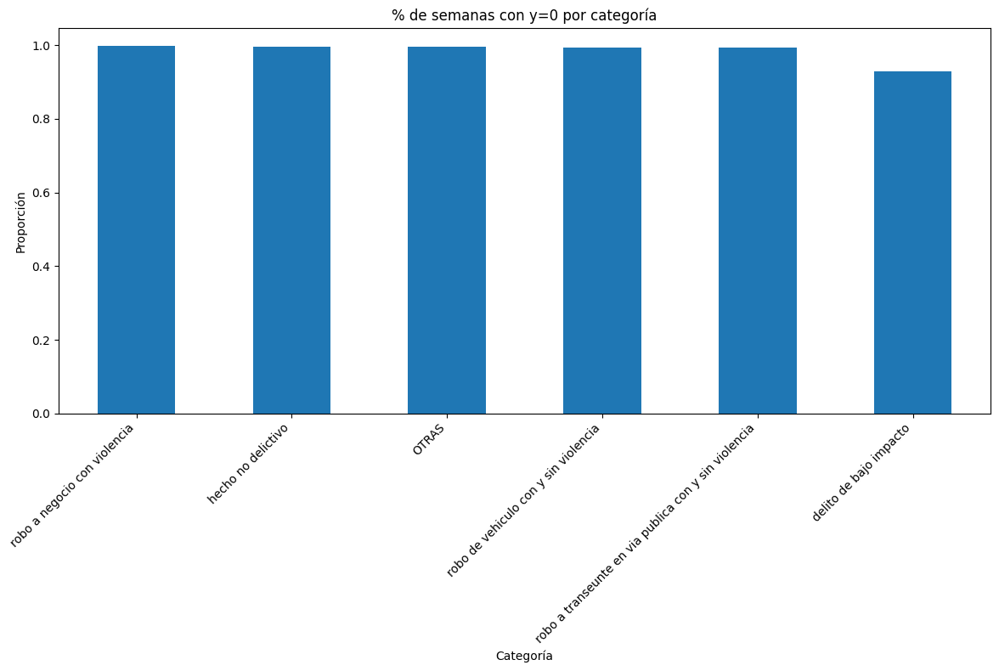

In [50]:
# % de ceros por categoria
zero_rate = (
    counts_W_ctx
    .assign(is_zero=(counts_W_ctx["y"]==0))
    .groupby("categoria_delito")["is_zero"]
    .mean()
    .sort_values(ascending=False)
)

plt.figure(figsize=(12,8))
zero_rate.plot(kind="bar")
plt.title("% de semanas con y=0 por categoría")
plt.ylabel("Proporción")
plt.xlabel("Categoría")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


Este gráfico muestra qué tan esparcida o discontinua es la serie temporal para cada tipo de delito. Es decir, este gráfico confirma que la base es estructuralmente zero-dominant, y que el futuro modelo espacio-temporal deberá incorporar mecanismos para manejar datos escasos, ya sea con agregación, suavizado o modelado jerárquico por cluster.

Este resultado tiene implicancia para el modelado:

1. Dominio de ceros

- Los modelos deben manejar explícitamente la sobrerrepresentación de ceros (Zero Inflation).

- Estrategias: modelos Zero-Inflated Poisson / Negative Binomial, o enfoques de clasificación binaria (y>0) seguidos de regresión de conteo.

2. Necesidad de agregación espacial o temporal

- A nivel de celda-semana, los datos son demasiado dispersos.

- Conviene:

  - Agrupar por cluster_id + categoría + semana, o

  - Usar ventanas móviles (rolling sum de 4–8 semanas) para capturar señal.

3. Dificultad para aprender patrones individuales

- Un modelo por celda será, probablemente, ineficiente: la mayoría no tiene suficientes muestras positivas.

- El enfoque debe ser multicelda o clusterizado, aprovechando los contextos espaciales (cluster_id, ghost_min_dist_m, cluster_density).

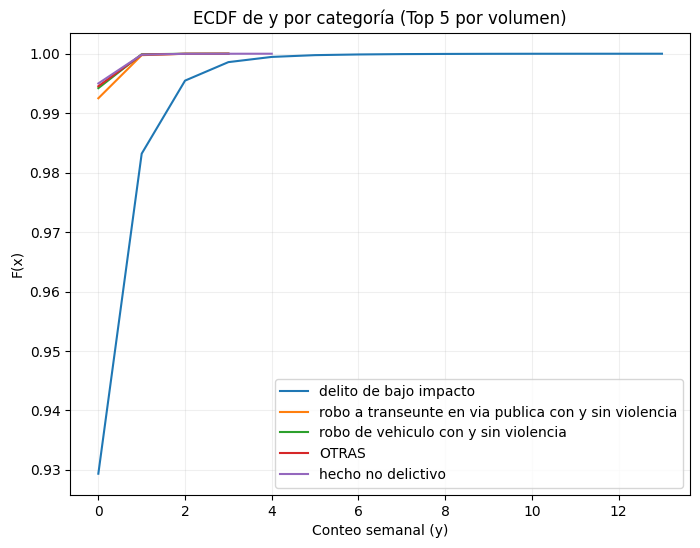

In [51]:
# Distribución de y (ECDF) por categoría (top 5 por volumen)
totals_by_cat = counts_W_ctx.groupby("categoria_delito")["y"].sum().sort_values(ascending=False)
top_cats = totals_by_cat.head(5).index.tolist()

plt.figure(figsize=(8,6))
for cat in top_cats:
    yy = counts_W_ctx.loc[counts_W_ctx["categoria_delito"]==cat, "y"].astype(float).values
    yy = np.sort(yy)
    x = np.unique(yy)
    y = np.searchsorted(yy, x, side="right")/yy.size
    plt.plot(x, y, label=cat)

plt.title("ECDF de y por categoría (Top 5 por volumen)")
plt.xlabel("Conteo semanal (y)")
plt.ylabel("F(x)")
plt.legend()
plt.grid(alpha=0.2)
plt.show()

Este gráfico es la ECDF (Empirical Cumulative Distribution Function) de los conteos semanales por categoría, y complementa perfectamente el análisis de esparsidad.

- Eje X: conteo semanal y (número de eventos por celda y semana).

- Eje Y: F(x) — la probabilidad acumulada de que y sea menor o igual a un valor dado.

- Cada curva representa una categoría de delito.

En palabras simples: mide qué proporción de observaciones tiene conteos ≤ x. Por ejemplo, si F(0.5)=0.93, significa que el 93% de las semanas tienen y = 0.

In [52]:
# Mapa base de celdas activas (choropleth) 
m = myUtils.make_folium_map_active_cells(
    active_cells_df=active_cells,            # [cell_id, categoria_delito, total_events]
    cell_col="cell_id",
    cat_col="categoria_delito",
    events_col="total_events",
    method="h3",
    aggregate_across_categories=True,
    max_cells=4000,
    show_polygons=True,
    tiles="CartoDB positron",
    zoom_start=11,
)

# Capa: celdas fantasma (muestreo si son muchas) 
ghosts_sample = ghosts.sample(n=min(1500, len(ghosts)), random_state=42) if len(ghosts) > 1500 else ghosts

layer_ghosts = folium.FeatureGroup(name="Celdas FANTASMA", show=True)
for _, r in ghosts_sample.iterrows():
    cent = myUtils.cells_to_centroids([r["cell_id"]], method="h3")
    lat, lon = float(cent["lat"].iloc[0]), float(cent["lon"].iloc[0])
    folium.CircleMarker(
        location=(lat, lon),
        radius=3,
        color="#d7301f",
        fill=True,
        fill_color="#d7301f",
        fill_opacity=0.6,
        tooltip=f"Ghost: {r['cell_id']}"
    ).add_to(layer_ghosts)
layer_ghosts.add_to(m)

# Capa: centroides de clusters (lat/lon promedio de las celdas del cluster)

# Pares únicos (cluster_id, cell_id)
cells_by_cluster = (
    counts_W_ctx.dropna(subset=["cluster_id", "cell_id"])[["cluster_id", "cell_id"]]
    .drop_duplicates()
    .copy()
)
# Asegura tipo entero si viene como float
try:
    cells_by_cluster["cluster_id"] = pd.to_numeric(cells_by_cluster["cluster_id"], errors="coerce").astype("Int64")
except Exception:
    pass

# Centroides H3 para todas las celdas involucradas
all_cells = cells_by_cluster["cell_id"].unique().tolist()
cells_centroids = myUtils.cells_to_centroids(all_cells, method="h3")  # -> [cell_id, lon, lat]

# Une lat/lon por celda y promedia por cluster
cells_latlon = cells_by_cluster.merge(
    cells_centroids[["cell_id", "lat", "lon"]],
    on="cell_id", how="left"
)

cluster_centroids_latlon = (
    cells_latlon.groupby("cluster_id", as_index=False)[["lat", "lon"]]
    .mean()
    .dropna(subset=["lat", "lon"])
)

# Pinta los centroides de clusters
layer_clusters = folium.FeatureGroup(name="Centroides de clusters", show=True)
for _, row in cluster_centroids_latlon.iterrows():
    cid = int(row["cluster_id"])
    lat, lon = float(row["lat"]), float(row["lon"])
    folium.CircleMarker(
        location=(lat, lon),
        radius=6,
        color="black",
        fill=True,
        fill_color="yellow",
        tooltip=f"Cluster {cid}",
    ).add_to(layer_clusters)
layer_clusters.add_to(m)

folium.LayerControl(collapsed=False).add_to(m)
m

Qué muestra el mapa:

1. Polígonos azules (hexágonos H3)
- Son las celdas activas, es decir, las unidades espaciales donde se han registrado suficientes incidentes históricos (según tus umbrales de ≥ 10 totales y ≥ 3 por categoría).
- Estas celdas conforman la malla efectiva de entrenamiento, donde los modelos verán datos reales.

2. Puntos rojos sobrepuestos
- Representan las celdas fantasma (ghosts): ubicaciones que existen en la grilla pero con actividad temporal casi nula (por ejemplo, menos de 1 % de semanas activas).
- Son esenciales para medir sparsidad espacial y para construir la feature contextual ghost_min_dist_m, que es la distancia a la celda activa más cercana.

3. Círculos con borde negro
- Son los centroides de los 20 clusters geográficos que definiste con tu KMeans espacial.
- Cada uno agrupa celdas geográficamente cercanas y densas, y sirve como contexto regional (cluster_id, cluster_density, cluster_dist_m).

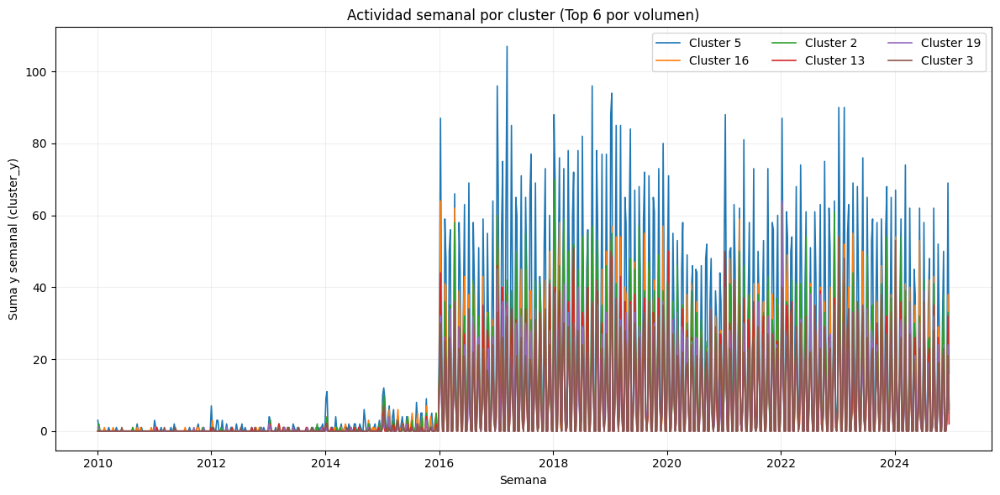

In [53]:
# Asegura nombres: cluster_weekly con columnas ['cluster_id','ds','cluster_y']
if "cluster_y" not in cluster_weekly.columns:
    # si renombraste previamente
    cluster_weekly = cluster_weekly.rename(columns={"cluster_density":"cluster_y"})

# Elige clusters más activos para no saturar
top_clusters = (
    cluster_weekly.groupby("cluster_id")["cluster_y"].sum()
    .sort_values(ascending=False).head(6).index.tolist()
)

plt.figure(figsize=(12,6))
for cid in top_clusters:
    sub = cluster_weekly[cluster_weekly["cluster_id"]==cid].sort_values("ds")
    plt.plot(sub["ds"], sub["cluster_y"], label=f"Cluster {int(cid)}", linewidth=1.2)

plt.title("Actividad semanal por cluster (Top 6 por volumen)")
plt.xlabel("Semana")
plt.ylabel("Suma y semanal (cluster_y)")
plt.legend(ncol=3)
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()


- Eje X: tiempo (semanas, 2010–2024).

- Eje Y: número de incidentes semanales (cluster_y) por cada uno de los 6 clusters más activos (Top 6 por volumen).

- Cada color representa un cluster geográfico distinto.

Observaciones:

- El sistema presenta estacionalidad fuerte y coherente entre clusters.

- Se valida la integridad temporal: no hay saltos incoherentes, solo un cambio estructural en 2016.

- Hay heterogeneidad espacial: algunos clusters tienen 5–6 veces más eventos que otros.

- Las señales temporales y espaciales son consistentes: ideales para modelado espacio-temporal (Prophet, SARIMAX, XGBoost temporal).

# **5. ETIQUETADO DE DIAS y SPLITS TEMPORALES**

PROPÓSITO:
- make_window_labels_N: construye etiquetas para una ventana FUTURA de N días:
       * y_cnt_N = sum_{d=t..t+N-1} y_d
       * y_bin_N = 1[y_cnt_N >= 1]
- make_temporal_splits: asigna set={train,val,test} sin fugas, garantizando
       que t+N-1 cae dentro del rango del split.

Asumimos que:
- df tiene continuidad temporal por (cell_id, categoria_delito) con freq="D"
- Columnas: date_col (datetime), cell_col, cat_col, y_col='y'
- N ∈ [2,6] típicamente, pero puede ser editado

Inputs:
- df: DataFrame
- date_col: str, columna de fecha (diaria)
- cell_col, cat_col, y_col: nombres de columnas
- N: int, ventana en días
- out_bin_col/out_cnt_col: nombres de columnas de salida
- Ranges YYYY-MM-DD para train/test/val (opcional)

Outputs:
- df con columnas de etiquetas agregadas (y_bin_N, y_cnt_N)
- df con columna 'set' (train/test/val) según fechas y garantía de label dentro del split

Expected outcomes/metrics:
- Prevalencias por split y categoría estables, sin fuga temporal

Notas:
- Sin fuga: el cómputo de etiquetas usa FUTURO [t..t+N-1], por eso recortaremos por split comparando t+N-1 con el fin del split.

## 5.1 ETIQUETADO DE N-DIAS

In [54]:
# Construir base diaria 2016–2024 (sin contexto futuro)
counts_D = myUtils.aggregate_counts_by_cell_category(
    df=df, 
    date_col="fecha_evento",
    cell_col="cell_id",
    cat_col="categoria_delito",
    start_date="2016-01-01",
    end_date="2024-12-31",
    freq="D",
    complete_grid=True
)
counts_D

,ds,cell_id,categoria_delito,y
0,2016-01-01,8849864921fffff,delito de bajo impacto,0.0
1,2016-01-02,8849864921fffff,delito de bajo impacto,0.0
2,2016-01-03,8849864921fffff,delito de bajo impacto,0.0
3,2016-01-04,8849864921fffff,delito de bajo impacto,0.0
4,2016-01-05,8849864921fffff,delito de bajo impacto,0.0
...,...,...,...,...
15276487,2024-12-06,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0
15276488,2024-12-07,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0
15276489,2024-12-08,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0
15276490,2024-12-09,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0


In [55]:
counts_D.shape

(15276492, 4)

In [56]:
#  Añadir contexto ESTÁTICO por celda (no hay fuga): cluster_id y ghost features

# Mapeo celda->cluster_id por mayoría 
static_cell = cell2cluster_from_inc[["cell_id","cluster_id"]].drop_duplicates()

# Ghost features (renombradas para merge por celda)
ghosts_feat_for_merge = ghosts_feat.rename(columns={
    "ghost_cell_id": "cell_id",
    "min_dist_m": "ghost_min_dist_m",
    "is_near_active": "ghost_is_near_active"
})[["cell_id","ghost_min_dist_m","ghost_is_near_active"]].drop_duplicates()

ghosts_feat_for_merge

,cell_id,ghost_min_dist_m,ghost_is_near_active
0,8849864921fffff,0.000000,True
1,8849864923fffff,0.000000,True
2,8849864925fffff,0.000000,True
3,8849864927fffff,985.945914,True
4,884986492bfffff,989.504019,True
...,...,...,...
1079,884995bb65fffff,0.000000,True
1080,884995bb67fffff,0.000000,True
1081,884995bb69fffff,0.000000,True
1082,884995bb6bfffff,0.000000,True


In [57]:
# Distancia celda->centroide de cluster 
cell_cluster_dist: ['cell_id','cluster_id','cluster_dist_m']
cell_cluster_dist

,cell_id,x_m,y_m,cluster_id,cx_m,cy_m,cluster_dist_m
0,8849864921fffff,-10682.398042,-21098.402074,8.285714,NaN,NaN,NaN
1,8849864923fffff,-11090.538394,-20663.813938,9.000000,-10217.140576,-13876.528962,6843.249308
2,8849864925fffff,-9914.225175,-21226.282153,8.000000,-4710.719916,-17329.372653,6500.951517
3,8849864927fffff,-10437.612970,-20875.823570,8.000000,-4710.719916,-17329.372653,6736.068449
4,884986492bfffff,-11316.372037,-21508.050251,9.000000,-10217.140576,-13876.528962,7710.280604
...,...,...,...,...,...,...,...
1079,884995bb65fffff,5996.104330,-4489.833890,12.661972,NaN,NaN,NaN
1080,884995bb67fffff,5515.811444,-3772.553735,5.318681,NaN,NaN,NaN
1081,884995bb69fffff,4458.532226,-5456.905975,19.000000,4185.770247,-6025.631410,630.751708
1082,884995bb6bfffff,3969.745395,-4620.432356,19.000000,4185.770247,-6025.631410,1421.707114


In [58]:
counts_D_ctx = counts_D.merge(static_cell, on="cell_id", how="left")
counts_D_ctx = counts_D_ctx.merge(ghosts_feat_for_merge, on="cell_id", how="left")
counts_D_ctx = counts_D_ctx.merge(cell_cluster_dist[["cell_id","cluster_id","cluster_dist_m"]],
                                       on=["cell_id","cluster_id"], how="left")
counts_D_ctx

,ds,cell_id,categoria_delito,y,cluster_id,ghost_min_dist_m,ghost_is_near_active,cluster_dist_m
0,2016-01-01,8849864921fffff,delito de bajo impacto,0.0,8.0,0.0,True,NaN
1,2016-01-02,8849864921fffff,delito de bajo impacto,0.0,8.0,0.0,True,NaN
2,2016-01-03,8849864921fffff,delito de bajo impacto,0.0,8.0,0.0,True,NaN
3,2016-01-04,8849864921fffff,delito de bajo impacto,0.0,8.0,0.0,True,NaN
4,2016-01-05,8849864921fffff,delito de bajo impacto,0.0,8.0,0.0,True,NaN
...,...,...,...,...,...,...,...,...
15276487,2024-12-06,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,19.0,0.0,True,1468.944967
15276488,2024-12-07,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,19.0,0.0,True,1468.944967
15276489,2024-12-08,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,19.0,0.0,True,1468.944967
15276490,2024-12-09,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,19.0,0.0,True,1468.944967


In [59]:
counts_D_ctx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15276492 entries, 0 to 15276491
Data columns (total 8 columns):
 #   Column                Dtype         
---  ------                -----         
 0   ds                    datetime64[ns]
 1   cell_id               object        
 2   categoria_delito      object        
 3   y                     float64       
 4   cluster_id            float64       
 5   ghost_min_dist_m      float64       
 6   ghost_is_near_active  bool          
 7   cluster_dist_m        float64       
dtypes: bool(1), datetime64[ns](1), float64(4), object(2)
memory usage: 830.4+ MB


In [60]:
# Debemos tener NaN en las últimas (N-1) filas de cada grupo
checks = (
    counts_D_ctx
    .groupby(["cell_id","categoria_delito"])["ds"]
    .count()
    .head()
)
print("Grupos de ejemplo y sus longitudes:\n", checks)

Grupos de ejemplo y sus longitudes:
 cell_id          categoria_delito                    
8849864921fffff  delito de bajo impacto                  3267
8849864923fffff  delito de bajo impacto                  3267
8849864925fffff  delito de bajo impacto                  3267
                 robo de vehiculo con y sin violencia    3267
8849864927fffff  hecho no delictivo                      3267
Name: ds, dtype: int64


In [61]:
counts_D_lab = myUtils.make_window_labels_N(
    df=counts_D_ctx, date_col="ds", cell_col="cell_id",
    cat_col="categoria_delito", y_col="y",
    N=N_DIAS_TO_PREDICTION,
    out_bin_col=f"y_bin_N{N_DIAS_TO_PREDICTION}",
    out_cnt_col=f"y_cnt_N{N_DIAS_TO_PREDICTION}",
    keep_partial_tail=False,
)

counts_D_lab[[ "ds","cell_id","categoria_delito","y",
               f"y_cnt_N{N_DIAS_TO_PREDICTION}",
               f"y_bin_N{N_DIAS_TO_PREDICTION}"]]

,ds,cell_id,categoria_delito,y,y_cnt_N3,y_bin_N3
0,2016-01-01,8849864921fffff,delito de bajo impacto,0.0,NaN,0
1,2016-01-02,8849864921fffff,delito de bajo impacto,0.0,NaN,0
2,2016-01-03,8849864921fffff,delito de bajo impacto,0.0,0.0,0
3,2016-01-04,8849864921fffff,delito de bajo impacto,0.0,0.0,0
4,2016-01-05,8849864921fffff,delito de bajo impacto,0.0,0.0,0
...,...,...,...,...,...,...
15276487,2024-12-06,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,0
15276488,2024-12-07,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,0
15276489,2024-12-08,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,0.0,0
15276490,2024-12-09,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,NaN,0


## 5.2 SPLIT TEMPORAL

In [62]:
# Splits temporales: solamente Train/Test (daros de Validación se deja como opcional/desactivada)
counts_D_split = myUtils.make_temporal_splits(
    df=counts_D_lab,
    date_col="ds",
    N=N_DIAS_TO_PREDICTION,
    train_range=("2016-01-01", "2022-12-31"),
    test_range=("2023-01-01", "2024-12-31"),
    val_range=None,  # sólo Train/Test
    label_cols=(f"y_cnt_N{N_DIAS_TO_PREDICTION}", f"y_bin_N{N_DIAS_TO_PREDICTION}"),  # filtra filas sin etiqueta completa
)

counts_D_split["set"].value_counts(dropna=False)

set
train    11937828
test      3310608
<NA>        28056
Name: count, dtype: int64

In [63]:
# QA de prevalencias por split y categoría
prev = myUtils.summarize_split_prevalence(
    df=counts_D_split,
    split_col="set",
    bin_label_col=f"y_bin_N{N_DIAS_TO_PREDICTION}",
    cat_col="categoria_delito",
)
prev.sort_values(["set","pos_rate"], ascending=[True, False]).head(20)

,set,categoria_delito,n,n_pos,pos_rate
1,test,delito de bajo impacto,764640,44538,0.058247
4,test,robo a transeunte en via publica con y sin vio...,530292,1860,0.003508
0,test,OTRAS,537372,1476,0.002747
5,test,robo de vehiculo con y sin violencia,586224,1473,0.002513
2,test,hecho no delictivo,530292,999,0.001884
3,test,robo a negocio con violencia,361788,471,0.001302
7,train,delito de bajo impacto,2757240,154885,0.056174
10,train,robo a transeunte en via publica con y sin vio...,1912197,11457,0.005992
11,train,robo de vehiculo con y sin violencia,2113884,9791,0.004632
6,train,OTRAS,1937727,8291,0.004279


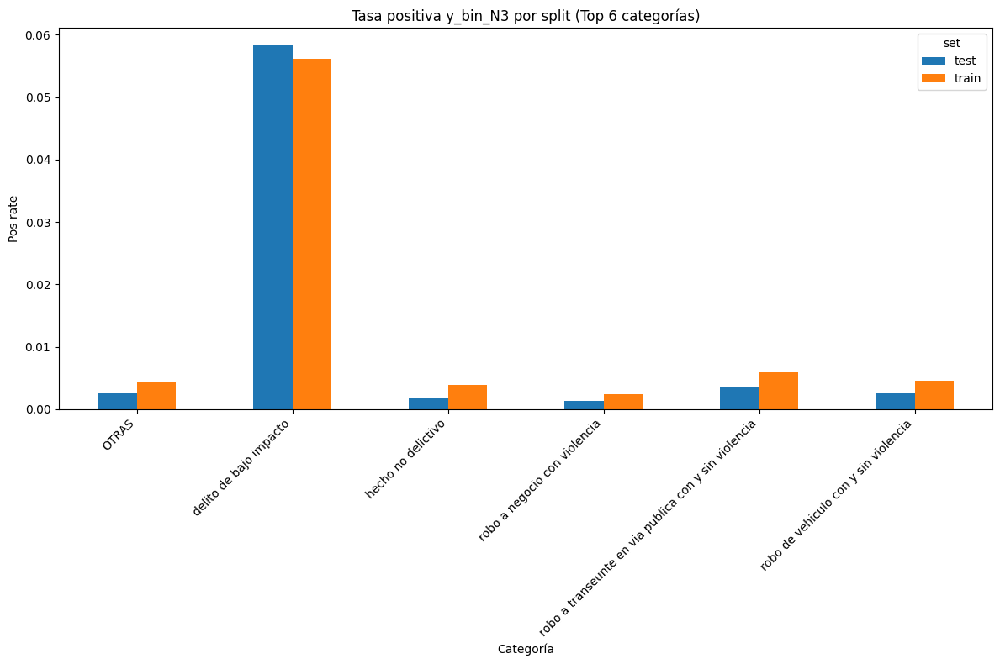

In [64]:
# Visual rápida: tasas positivas por split (Top 6 categorías por volumen)

vol = (counts_D_split.groupby("categoria_delito")["y"].sum().sort_values(ascending=False).head(6).index.tolist())
pv = prev[prev["categoria_delito"].isin(vol)]
pivot = pv.pivot(index="categoria_delito", columns="set", values="pos_rate").fillna(0.0)

pivot.plot(kind="bar", figsize=(12,8))
plt.title(f"Tasa positiva y_bin_N{N_DIAS_TO_PREDICTION} por split (Top 6 categorías)")
plt.ylabel("Pos rate")
plt.xlabel("Categoría")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

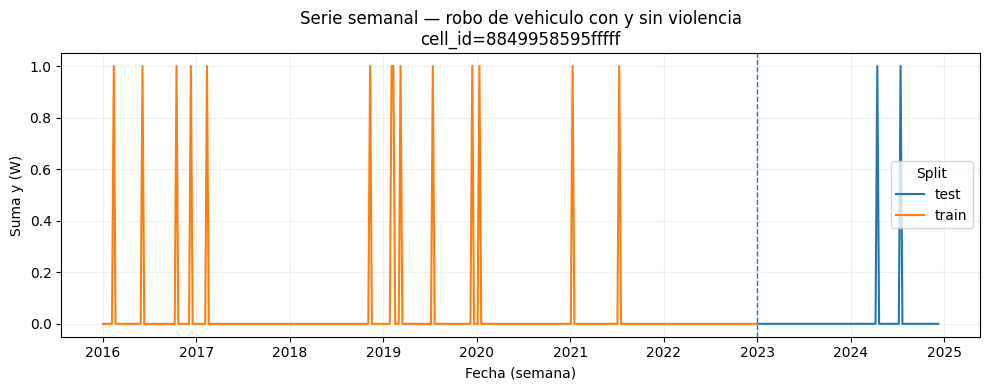

In [65]:
# elige una celda con volumen visible (top por suma)
top_cell = (
    counts_D_split[counts_D_split["categoria_delito"]=="robo de vehiculo con y sin violencia"]
    .groupby("cell_id")["y"].sum().sort_values(ascending=False).head(1).index[0]
)

myUtils.plot_train_test_series_cell_cat(
    counts_D_split,
    cell_id=top_cell,
    categoria="robo de vehiculo con y sin violencia",
    test_start="2023-01-01",
)

Lo que observamos para esta categoria:

1. Eje X (horizontal): semanas entre 2016 y 2025.

* El corte punteado en 2023 marca la división entre los conjuntos train (2016–2022) y test (2023–2024).

* Todo lo anterior a la línea azul punteada pertenece al entrenamiento.

2. Eje Y (vertical): Suma y (W) = número de incidentes en esa celda durante cada semana.

* Los valores son muy bajos (máximo ≈ 1), lo que indica una frecuencia extremadamente esporádica de incidentes.

3. Curva naranja (train):

* Entre 2016 y 2022 se observan algunos picos aislados (semanas con exactamente 1 evento).

* No hay patrones de continuidad ni tendencias; los puntos están dispersos, separados por largos periodos de cero.

4. Curva azul (test):

* En el periodo 2023–2024 apenas hay dos o tres semanas con actividad (valor 1) y el resto son ceros.

* Esto refleja muy poca recurrencia reciente, aunque la celda sigue registrando ocasionalmente incidentes.


Con esto observamos también que la segmentación temporal está correcta pues no hay fugas: cada punto azul ocurre después del corte temporal. Sin embargo, el modelo de predicción en esta celda no debería intentar estimar conteos exactos, sino la probabilidad de ocurrencia (y>0).

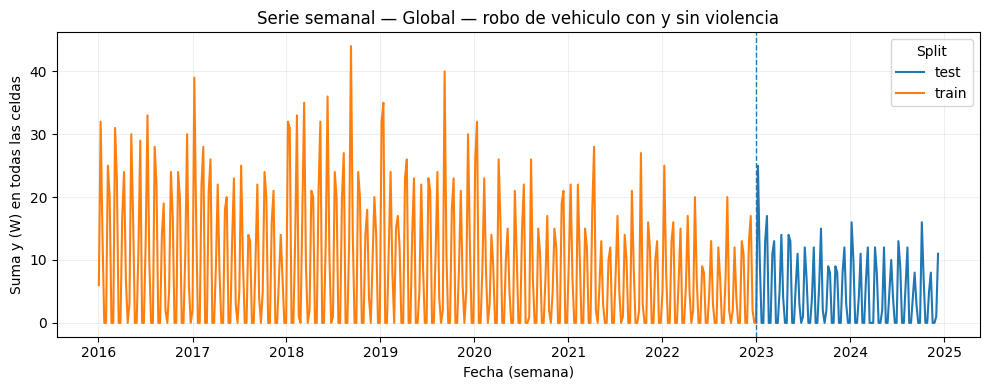

In [66]:
myUtils.plot_train_test_series_by_category_global(
    counts_D_split,
    categoria="robo de vehiculo con y sin violencia",
    test_start="2023-01-01",
)

OLa serie global muestra un patrón semanal estable y continuo de robos de vehículo entre 2016 y 2022, con una leve tendencia a la baja y oscilaciones regulares.
A partir de 2023, los valores caen notablemente, lo que sugiere un cambio de régimen temporal que podría afectar la capacidad 
predictiva si el modelo no incorpora mecanismos de ajuste (por ejemplo, ponderación temporal o recalibración). Considerar:

1. Entrenamiento (naranja, 2016–2022)

 - Se observa una actividad estable pero con ruido semanal, con picos frecuentes de entre 20 y 40 incidentes semanales.

 - Existe un patrón de variación estacional leve, pero sin tendencia ascendente o descendente clara.

 - Entre 2018 y 2022 se nota una ligera disminución en la frecuencia de los picos, lo que podría reflejar una reducción paulatina o cambios en la denuncia.

2. Prueba (azul, 2023–2024)

 - Se aprecia un descenso evidente del volumen de robos: la mayoría de las semanas tienen menos de 15 eventos, y los picos son menos pronunciados.

 - Esto sugiere un cambio estructural en la dinámica delictiva o en el registro de datos posteriores a 2022.

Es necesario considerar un posible drift temporal: el descenso post-2023 puede implicar una modificación en el comportamiento o una ruptura de distribución entre train y test, que los modelos deberán manejar con cuidado.

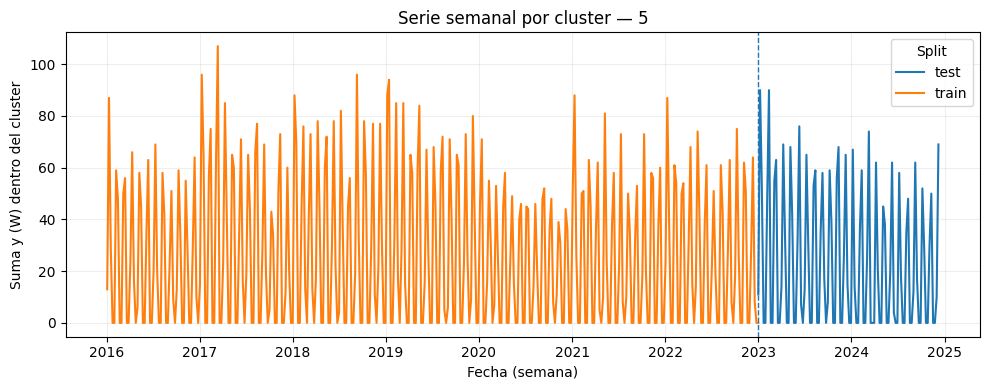

In [67]:
# Es posible elegir un cluster con volumen
top_cluster = (
    counts_D_split.groupby("cluster_id")["y"].sum().sort_values(ascending=False).head(1).index[0]
)

myUtils.plot_train_test_series_by_cluster(
    counts_D_split,
    cluster_id=int(top_cluster),
    test_start="2023-01-01",
)

En caso del cluster 5, se observa que es un área de alta densidad criminal, con comportamiento temporal consistente y marcada estacionalidad semanal. Durante 2016–2022 mantiene niveles de entre 40 y 100 incidentes semanales, mientras que en 2023–2024 la actividad persiste, aunque con menor intensidad.

Este patrón sugiere persistencia geotemporal del fenómeno delictivo, lo que lo convierte en un excelente referente para evaluar modelos de predicción espacial-temporal.

1. Eje X (horizontal)

- Semanas comprendidas entre 2016 y 2025.

- La línea vertical punteada marca enero de 2023, que separa los conjuntos:

- Naranja: periodo de entrenamiento (2016–2022).

- Azul: periodo de prueba (2023–2024).

2. Eje Y (vertical)

- Representa la suma semanal de eventos (robos, probablemente de distintas categorías) dentro del cluster 5.

- Los valores oscilan principalmente entre 20 y 100 eventos por semana, lo que indica un área con alta concentración delictiva.


Análisis e implicaciones:

* Este cluster refleja una zona caliente estable: actividad constante, sin periodos extensos sin incidentes.

* El hecho de que mantenga un patrón regular lo hace muy adecuado para entrenamiento de modelos predictivos, ya que ofrece señal temporal clara.

* Sin embargo, el ligero descenso post-2023 podría anticipar un cambio de régimen o políticas locales que reduzcan la incidencia, lo que debe considerarse en la validación (posible temporal drift).


Un **temporal drift** es un cambio en la distribución temporal de los datos. Por ejemplo, cuando la frecuencia o el patrón de delitos cambia con el tiempo. Esto tiene una implicancia clara: el modelo entrenado en años anteriores puede perder precisión en periodos recientes, porque las relaciones aprendidas (patrones, estacionalidad, intensidad) ya no reflejan la realidad actual.

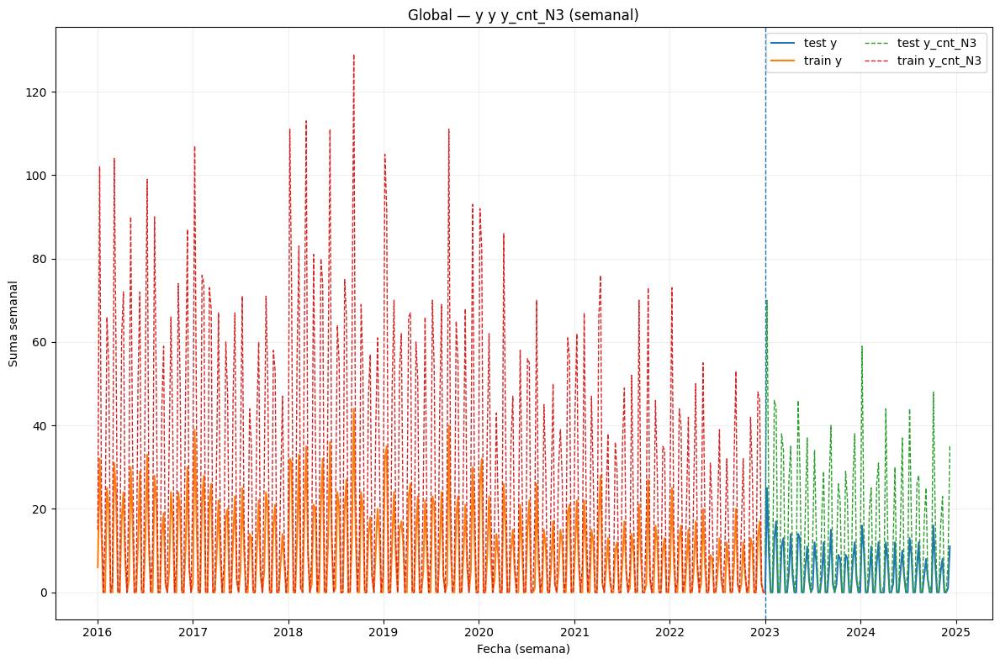

In [68]:
# overlay de la etiqueta (global por categoría)
label_col = f"y_cnt_N{N_DIAS_TO_PREDICTION}"

sub = counts_D_split[counts_D_split["categoria_delito"]=="robo de vehiculo con y sin violencia"].copy()
subW = sub.set_index("ds").groupby("set").resample("W")["y"].sum().reset_index()
labW = sub.set_index("ds").groupby("set").resample("W")[label_col].sum().reset_index()

fig, ax = plt.subplots(figsize=(12,8))
for name, g in subW.groupby("set"):
    ax.plot(g["ds"], g["y"], label=f"{name} y")

# Overlay etiqueta (suavizada/semanal)
for name, g in labW.groupby("set"):
    ax.plot(g["ds"], g[label_col], linestyle="--", linewidth=1, label=f"{name} {label_col}")

ax.axvline(pd.to_datetime("2023-01-01"), linestyle="--", linewidth=1)
ax.set_title(f"Global — y y {label_col} (semanal)")
ax.set_xlabel("Fecha (semana)")
ax.set_ylabel("Suma semanal")
ax.grid(alpha=0.2)
ax.legend(ncol=2)
plt.tight_layout()
plt.show()


El gráfico muestra que el volumen delictivo global presenta una estacionalidad clara y una tendencia descendente a largo plazo.
La etiqueta de predicción (y_cnt_N3) sigue fielmente la dinámica de y, amplificando sus picos por acumulación de corto plazo.
Sin embargo, tras 2022 se observa un descenso notable de la actividad que confirma un cambio estructural (temporal drift).

Análisis:

1. Ejes:

- X: semanas entre 2016 y 2025.

- Y: suma total semanal de incidentes en todas las celdas.

2. Series:

- train y (naranja) → conteos semanales originales usados para entrenar.

- train y_cnt_N3 (rojo punteado) → suma de eventos esperados en las próximas 3 semanas (la etiqueta objetivo).

- test y (azul) y test y_cnt_N3 (verde punteado) → el mismo concepto aplicado al conjunto de prueba (2023–2024).


Observaciones a considerar:

1. Estructura temporal:

- Hay una fuerte correspondencia entre y y y_cnt_N3, ya que la etiqueta refleja acumulación de corto plazo.

- Ambas mantienen la estacionalidad semanal: picos regulares y un patrón de descenso gradual hacia 2021–2022.

2. Tendencia general:

- Desde 2016 hasta 2022 se observa una reducción sostenida en la magnitud de los eventos —los picos bajan de 100+ a 40–50.

- En el periodo de prueba (2023–2024), los valores permanecen más bajos y estables, lo que confirma el temporal drift.

3. Magnitud relativa:

- y_cnt_N3 (rojo/verde) siempre está por encima de y, como es lógico: acumula los eventos de una ventana de tres semanas.

- La diferencia entre ambas curvas cuantifica la intensidad acumulada del delito y el horizonte de predicción.

# 6. FEATURE ENGINEERING (temporal + espacial + calendario)

Purpose: Construir features sin fuga temporal para predicción en ventana N días a partir de series diarias por (cell_id, categoria_delito).

Overall idea:
- Temporales: lags y rolling stats sobre y utilizando historia hasta t-1.
- Espaciales: agregados recientes en vecindad H3 (k-ring) y a nivel cluster.
- Calendario: d.weekday, fines de semana, codificación cíclica semana/mes.
- Priors: densidad histórica en ventanas largas (1y/2y) cerradas en t-1.

Assumptions:
- df es diario y continuo por grupo, con columnas:       ['ds','cell_id','categoria_delito','y','set','cluster_id', ...]
     y etiquetas ya calculadas: y_bin_N*, y_cnt_N* 
- H3 está instalado (v4 recomendado). Si no, limitar features vecinales.
- No se crean columnas de objetivo; solo features.

Inputs/Outputs:
- build_features_for_window_N(df, N, ...) -> df con columnas de features.

Metrics/Outcome:
- Sin fuga: ninguna feature usa información de [t..t+N-1].
- Incremento de señal (medible luego con XGB ligero en train).


In [69]:
label_bin = f"y_bin_N{N_DIAS_TO_PREDICTION}"
label_cnt = f"y_cnt_N{N_DIAS_TO_PREDICTION}"
date_col = "ds"

# Selecciona periodo de trabajo 
counts_D_split = counts_D_split[(counts_D_split[date_col] >= "2016-01-01") & (counts_D_split[date_col] <= "2024-12-31")]
counts_D_split

,ds,cell_id,categoria_delito,y,cluster_id,ghost_min_dist_m,ghost_is_near_active,cluster_dist_m,y_cnt_N3,y_bin_N3,set
0,2016-01-01,8849864921fffff,delito de bajo impacto,0.0,8.0,0.0,True,NaN,NaN,0,<NA>
1,2016-01-02,8849864921fffff,delito de bajo impacto,0.0,8.0,0.0,True,NaN,NaN,0,<NA>
2,2016-01-03,8849864921fffff,delito de bajo impacto,0.0,8.0,0.0,True,NaN,0.0,0,train
3,2016-01-04,8849864921fffff,delito de bajo impacto,0.0,8.0,0.0,True,NaN,0.0,0,train
4,2016-01-05,8849864921fffff,delito de bajo impacto,0.0,8.0,0.0,True,NaN,0.0,0,train
...,...,...,...,...,...,...,...,...,...,...,...
15276487,2024-12-06,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,19.0,0.0,True,1468.944967,0.0,0,test
15276488,2024-12-07,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,19.0,0.0,True,1468.944967,0.0,0,test
15276489,2024-12-08,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,19.0,0.0,True,1468.944967,0.0,0,test
15276490,2024-12-09,884995bb6dfffff,robo de vehiculo con y sin violencia,0.0,19.0,0.0,True,1468.944967,NaN,0,<NA>


In [70]:
COUNTS_D_SPLIT_DIR = os.path.join(BASE_DIR, "results", "features_temporal_series")
os.makedirs(COUNTS_D_SPLIT_DIR, exist_ok=True)

count_split_fname = f"counts_D_split_temp_serie__N{N_DIAS_TO_PREDICTION}_D{date_col}_v1.joblib"
count_split_fpath = os.path.join(COUNTS_D_SPLIT_DIR, count_split_fname)

joblib.dump(counts_D_split, count_split_fpath, compress=("zlib", 3))
print("Features guardadas con joblib en:", count_split_fpath)

Features guardadas con joblib en: /Users/jorgevalverde/Documents/myEnv/crimen-cdmx/results/features_temporal_series/counts_D_split_temp_serie__N3_Dds_v1.joblib


## 6.1 CONSTRUIR FEATURES

In [71]:
# Podemos usar la función: myUtils.build_features_for_window_N
# Pero demora muchisimo, entonces la desglosamos aqui

def report(stage_name, X_prev, X_curr, t0):
    added = [c for c in X_curr.columns if c not in X_prev.columns]
    print(f"✔ {stage_name}: +{len(added)} cols, tiempo={time.perf_counter()-t0:.1f}s")
    if len(added) > 0:
        print("   Ejemplos:", added[:10])

# Punto de partida 
X0 = counts_D_split.copy()
print("Base:", X0.shape, "| cols:", len(X0.columns))

Base: (15276492, 11) | cols: 11


In [72]:
# Features Calendario
t = time.perf_counter()
X1 = myUtils.add_calendar_features(X0, date_col=date_col, add_weekday_onehot=False)
report("Calendario", X0, X1, t)

✔ Calendario: +6 cols, tiempo=1.1s
   Ejemplos: ['cal_dow', 'cal_is_weekend', 'cal_dow_sin', 'cal_dow_cos', 'cal_mon_sin', 'cal_mon_cos']


In [73]:
# Features Temporales (lags/rollings/trend)
t = time.perf_counter()
X2 = myUtils.add_temporal_lags_and_rollings(
    X1,
    group_cols=["cell_id","categoria_delito"],
    date_col=date_col,
    y_col="y",
    lags=[1,2,3,7,14,28],
    roll_windows=[7,14,28],
    add_trend14=True,
)
report("Temporales", X1, X2, t)

✔ Temporales: +16 cols, tiempo=183.4s
   Ejemplos: ['y_lag1', 'y_lag2', 'y_lag3', 'y_lag7', 'y_lag14', 'y_lag28', 'roll7_mean', 'roll7_std', 'roll7_sum', 'roll14_mean']


In [74]:
- temporal_lags=[1,2,3,7,14,28]: cuántos días atrás miras la serie de esa celda.

  - 1 = ayer, 7 = hace una semana, etc.

- temporal_rolls=[7,14,28]: medias/std/sum sobre y_lag1 en ventana pasada (señal “suavizada” sin fuga).

- add_trend14=True: pendiente en los últimos 14 días (basado en y_lag1).

SyntaxError: invalid character '“' (U+201C) (3382839977.py, line 5)

In [ ]:
# Señal regional por cluster 
t = time.perf_counter()
X3 = myUtils.add_cluster_signals(
    X2,
    cluster_col="cluster_id",
    date_col=date_col,
    y_col="y",
    lags=[1,7],          # puedes arrancar con [1] si quieres acelerar
    roll_windows=[7,28], # o solo [7]
    normalize_by_cells=True
)
report("Cluster", X2, X3, t)

- cluster_lags=[1,7] capta persistencia inmediata (ayer) y patrón semanal (hace 1 semana) del entorno regional donde está la celda.
- cluster_rolls=[7,28] añade la inercia reciente (promedio de la última semana) y una tendencia corta (≈ un mes), ambas basadas en pasado (via cluster_y_lag1), por lo que no hay fuga.

In [ ]:
# Features de la vecindad H3 (el más pesado en tiempo de ejecución pues revisamos todas las celdas hexagonales) 
t = time.perf_counter()
X4 = myUtils.add_neighbor_aggregates(
    X3,
    cell_col="cell_id",
    cat_col="categoria_delito",
    date_col=date_col,
    y_col="y",
    k=1,                 # incrementa a 2 si necesitas más vecindad
    from_lag=1,
    to_lag=7,            # reduce a 3 para acelerar
    agg_funcs=("mean","p90")
)
report("Vecindad H3", X3, X4, t)

- neighbor_k=1: anillo de vecinos H3 a 1 salto (≈ 6 hexágonos contiguos).

  - k=2 multiplica por mucho el costo (y el valor marginal no siempre compensa).

  - Mantén k=1 para producción y debugging.

- neighbors_lag_from=1, neighbors_lag_to=7: qué lags de vecinos agregas (t−1…t−7).

  - Reduce a to=3 para acelerar.

  - Métricas calculadas: mean y p90 entre vecinos → robusto a outliers.

- agg_funcs=("mean","p90"): deja solo "mean" si necesitas máximo rendimiento.

In [ ]:
# Feature de Priors (historia larga) 
t = time.perf_counter()
X5 = myUtils.add_long_history_priors(
    X4,
    group_cols=["cell_id","categoria_delito"],
    date_col=date_col,
    y_col="y",
    windows_days=[365, 730]  # arranca solo con 365 si quieres
)
report("Priors", X4, X5, t)

Se tiene que: long_windows=[365,730]: estadísticos de 1 y 2 años (cerrados en t−1).

In [ ]:
df_feats = X5
df_feats
print("Final:", df_feats.shape, "| cols:", len(df_feats.columns))

In [ ]:
df_feats

In [ ]:
FEATURES_DIR = os.path.join(BASE_DIR, "results", "features_temporal_series")
os.makedirs(FEATURES_DIR, exist_ok=True)

fname = f"feat_temp_serie__N{N_DIAS_TO_PREDICTION}_D{date_col}_v1.joblib"
fpath = os.path.join(FEATURES_DIR, fname)

joblib.dump(df_feats, fpath, compress=("zlib", 3))
print("Features guardadas con joblib en:", fpath)

In [ ]:
# Chequeo anti-fuga
leak_report = myUtils.validate_no_leakage(df_feats, date_col=date_col)
print(leak_report)

## 6.2 TEST RÁPIDO CON XGBOOST "LIGERO"

In [ ]:
# Conjunto de features numéricas (excluye claves, fechas y labels)
exclude_cols = {date_col, "cell_id", "categoria_delito", "set", label_bin, label_cnt}
X_cols = [c for c in df_feats.columns if c not in exclude_cols and pd.api.types.is_numeric_dtype(df_feats[c])]
X_cols

In [ ]:
train_df = df_feats[df_feats["set"] == "train"].dropna(subset=[label_bin])
X_train = train_df[X_cols]
y_train = train_df[label_bin].astype(int)

# Pesos por desbalance (aprox. pos_weight = (n_neg/n_pos))
pos_rate = y_train.mean()
scale_pos_weight = float((1 - pos_rate) / max(pos_rate, 1e-6))

In [ ]:
# Split interno para early-stopping respetando oden temporal (NO usar cuando se haga el test real)
X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train, test_size=0.2, shuffle=False)


In [ ]:
clf = XGBClassifier(
    n_estimators=150,
    max_depth=4,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="binary:logistic",
    eval_metric="logloss",   # necesario para early stopping
    n_jobs=-1,
    tree_method="hist",
    scale_pos_weight=scale_pos_weight,
    reg_lambda=1.0,
)
clf

In [ ]:
clf.fit(
    X_tr, y_tr,
    eval_set=[(X_val, y_val)],
    #callbacks=[EarlyStopping(rounds=20, save_best=True)],  
    verbose=False,
)

In [ ]:
# Importancias
imp = pd.DataFrame({
    "feature": X_cols,
    "importance": clf.feature_importances_
}).sort_values("importance", ascending=False).head(40)
imp

In [ ]:
y_val_pred = clf.predict_proba(X_val)[:,1]
ap = average_precision_score(y_val, y_val_pred)
print(f"AP (PR-AUC) en validación interna ~ {ap:.4f}")

In [ ]:
topk = imp.head(20)
plt.figure(figsize=(8,6))
plt.barh(topk["feature"][::-1], topk["importance"][::-1])
plt.title("Top 20 features por importancia (XGB ligero)")
plt.tight_layout()
plt.show()